In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
import geopandas as gpd
import numpy as np
import xarray as xr

In [2]:
# sf = xr.open_dataset(r'CLM4.SCALE_FACTOR.DS.G300KM.RL05.DSTvSCS1409.nc')
# sf

In [3]:
# sf['SCALE_FACTOR'].max()

In [5]:
# sf['SCALE_FACTOR'].min()

In [345]:
# gia = xr.open_dataset(r'Tellus_GIA_L3_PELTIER_ICE6G-D_0.5-DEG_v1.0.nc')
# gia

In [2]:
# --- Load your datasets and shapefile ---
EWH_trend_vlm = xr.open_dataset('delta_sigma_full_grids.nc') 
EWH_trend_vlm

<xarray.Dataset> Size: 8MB
Dimensions:      (latitude: 720, longitude: 1440)
Coordinates:
  * latitude     (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude    (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
Data variables:
    delta_sigma  (latitude, longitude) float64 8MB ...

In [3]:
vlm_trend_renamed = EWH_trend_vlm.rename({
    'delta_sigma': 'tws_trend',
    'longitude': 'lon',
    'latitude': 'lat'
})
vlm_trend_renamed

<xarray.Dataset> Size: 8MB
Dimensions:    (lat: 720, lon: 1440)
Coordinates:
  * lat        (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.25 89.5 89.75
  * lon        (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    tws_trend  (lat, lon) float64 8MB ...

In [7]:
# # Load your CSR mascon dataset
# data = xr.open_dataset('csr_mascon.nc')  # Replace with your file

vlm_quarterdegree = vlm_trend_renamed['tws_trend']     # Replace 'variable_name' with your variable

# Coarsen (aggregate) the data
vlm_quarterdegree_05 = vlm_quarterdegree.coarsen(lat=2, lon=2, boundary="trim").mean()  # Averaging

# Save the new grid if needed
vlm_quarterdegree_05.to_netcdf(r'vlm_05deg_full_grids_tws_trend_expressed_in_SD.nc')

In [4]:
observed_vlm_trend = xr.open_dataset(r'vlm_05deg_full_grids_tws_trend_expressed_in_SD.nc')
observed_vlm_trend

<xarray.Dataset> Size: 2MB
Dimensions:    (lat: 360, lon: 720)
Coordinates:
  * lat        (lat) float64 3kB -89.88 -89.38 -88.88 ... 88.62 89.12 89.62
  * lon        (lon) float64 6kB 0.125 0.625 1.125 1.625 ... 358.6 359.1 359.6
Data variables:
    tws_trend  (lat, lon) float64 2MB ...

In [5]:
# Assume `ds` is your xarray dataset
ds_vlm = observed_vlm_trend  # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = (ds_vlm['lon'] - 0.125) % 360  # Wrap around [0, 360)
shifted_lat = ds_vlm['lat'] - 0.125

# Update the dataset with the corrected coordinates
corrected_ds_vlm = ds_vlm.copy()
corrected_ds_vlm = corrected_ds_vlm.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_vlm = corrected_ds_vlm.sortby('lon')

# Display the corrected dataset
corrected_ds_vlm

<xarray.Dataset> Size: 2MB
Dimensions:    (lat: 360, lon: 720)
Coordinates:
  * lon        (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat        (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Data variables:
    tws_trend  (lat, lon) float64 2MB ...

In [10]:
corrected_ds_vlm.to_netcdf(r'observed_VLM_trend_05deg_full_grids.nc')

In [6]:
EWH_trend_vlm = xr.open_dataset(r'observed_VLM_trend_05deg_full_grids.nc')
EWH_trend_vlm

<xarray.Dataset> Size: 2MB
Dimensions:    (lat: 360, lon: 720)
Coordinates:
  * lon        (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat        (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Data variables:
    tws_trend  (lat, lon) float64 2MB ...

In [7]:
EWH_trend_vlm.tws_trend.values

array([[0.13108905, 0.13110169, 0.13111442, ..., 0.13105173, 0.13106407,
        0.13107651],
       [0.13567853, 0.1357921 , 0.13590587, ..., 0.13533942, 0.13545216,
        0.13556521],
       [0.14977732, 0.15003043, 0.15028274, ..., 0.1490139 , 0.14926897,
        0.14952347],
       ...,
       [0.00489513, 0.0055041 , 0.00611482, ..., 0.00308165, 0.00368361,
        0.0042882 ],
       [0.006875  , 0.00718698, 0.00749893, ..., 0.00594   , 0.00625141,
        0.00656311],
       [0.00779485, 0.00788035, 0.00796573, ..., 0.00753793, 0.00762362,
        0.00770927]], shape=(360, 720))

In [8]:
Half_degree_SF = xr.open_dataset(r'Scale_factor_half_degree_renamed_full_range.nc')
Half_degree_SF

<xarray.Dataset> Size: 2MB
Dimensions:       (lon: 720, lat: 360)
Coordinates:
  * lon           (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat           (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
Data variables:
    SCALE_FACTOR  (lat, lon) float64 2MB ...

In [9]:
scaled_EWH_trend_vlm = EWH_trend_vlm['tws_trend'] * Half_degree_SF['SCALE_FACTOR']
scaled_EWH_trend_vlm 

<xarray.DataArray (lat: 360, lon: 720)> Size: 2MB
array([[0.13108905, 0.13110169, 0.13111442, ..., 0.13105173, 0.13106407,
        0.13107651],
       [0.13567853, 0.1357921 , 0.13590587, ..., 0.13533942, 0.13545216,
        0.13556521],
       [0.14977732, 0.15003043, 0.15028274, ..., 0.1490139 , 0.14926897,
        0.14952347],
       ...,
       [0.00489513, 0.0055041 , 0.00611482, ..., 0.00308165, 0.00368361,
        0.0042882 ],
       [0.006875  , 0.00718698, 0.00749893, ..., 0.00594   , 0.00625141,
        0.00656311],
       [0.00779485, 0.00788035, 0.00796573, ..., 0.00753793, 0.00762362,
        0.00770927]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5

In [10]:
EWH_trend_vlm['tws_trend'].values 

array([[0.13108905, 0.13110169, 0.13111442, ..., 0.13105173, 0.13106407,
        0.13107651],
       [0.13567853, 0.1357921 , 0.13590587, ..., 0.13533942, 0.13545216,
        0.13556521],
       [0.14977732, 0.15003043, 0.15028274, ..., 0.1490139 , 0.14926897,
        0.14952347],
       ...,
       [0.00489513, 0.0055041 , 0.00611482, ..., 0.00308165, 0.00368361,
        0.0042882 ],
       [0.006875  , 0.00718698, 0.00749893, ..., 0.00594   , 0.00625141,
        0.00656311],
       [0.00779485, 0.00788035, 0.00796573, ..., 0.00753793, 0.00762362,
        0.00770927]], shape=(360, 720))

In [11]:
Half_degree_SF['SCALE_FACTOR'].min()

<xarray.DataArray 'SCALE_FACTOR' ()> Size: 8B
np.float64(-3.051480293273926)

----
-----

## Full GRACE signal from JPL

In [14]:
import os
os.path.exists(r'D:\MSRSGI\Lab Rotation\Physical Geodesy\Python_Workspace\Organaized\Mascon\Combined\Result\Processed Data\jpl_tws_pysh_normal_300km_GF.nc')

True

In [137]:
!pip install h5netcdf

In [138]:
import h5netcdf

In [17]:
full_grace_signal = xr.open_dataset(r'jpl_tws_pysh_normal_300km_GF.nc', engine = h5netcdf)
full_grace_signal

NameError: name 'h5netcdf' is not defined

In [15]:
# Assume `ds` is your xarray dataset
ds_grace = full_grace_signal  # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = (ds_grace['lon'] + 360) % 360  # Wrap around [0, 360)
shifted_lat = ds_grace['lat'] + 0.5

# Update the dataset with the corrected coordinates
corrected_ds_grace = ds_grace.copy()
corrected_ds_grace = corrected_ds_grace.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_grace = corrected_ds_grace.sortby('lon')

# Display the corrected dataset
corrected_ds_grace  #with_kn_in_JPL

NameError: name 'full_grace_signal' is not defined

In [5]:
full_grace_tws = corrected_ds_grace.tws
full_grace_tws

<xarray.DataArray 'tws' (time: 196, lat: 360, lon: 720)> Size: 203MB
[50803200 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2022-06-30
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Attributes:
    units:    mm

In [6]:
# slice time dimension from 2002-04-30 to 2016-03-31 (inclusive)
full_grace_tws = full_grace_tws.sel(time=slice('2002-04-30', '2016-03-31'))
full_grace_tws

<xarray.DataArray 'tws' (time: 140, lat: 360, lon: 720)> Size: 145MB
[36288000 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Attributes:
    units:    mm

In [7]:
full_grace_tws = full_grace_tws.resample(time='M').mean().interpolate_na(dim='time')
full_grace_tws #mm unit

C:\Users\sudur\miniconda3\envs\Thesis\Lib\site-packages\xarray\core\groupby.py:532: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index_grouper = pd.Grouper(


<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 174MB
array([[[-18.803244 , -18.810743 , -18.818262 , ..., -18.780869 ,
         -18.788305 , -18.795763 ],
        [-17.824068 , -17.852522 , -17.880981 , ..., -17.738804 ,
         -17.767206 , -17.79563  ],
        [-16.359514 , -16.420767 , -16.481836 , ..., -16.174816 ,
         -16.236526 , -16.298098 ],
        ...,
        [-38.398018 , -38.31737  , -38.236755 , ..., -38.640102 ,
         -38.559387 , -38.47869  ],
        [-35.790546 , -35.74103  , -35.691513 , ..., -35.93907  ,
         -35.889572 , -35.84006  ],
        [-33.873825 , -33.85667  , -33.839493 , ..., -33.92514  ,
         -33.908062 , -33.890957 ]],

       [[-21.903673 , -21.906666 , -21.909664 , ..., -21.894743 ,
         -21.897713 , -21.900688 ],
        [-21.256426 , -21.272108 , -21.287783 , ..., -21.209373 ,
         -21.225056 , -21.24074  ],
        [-20.047598 , -20.087847 , -20.127987 , ..., -19.92629  ,
         -19.966808 , -20.007248 ],
...
        [ 29.983395 ,  29.996708 ,  30.010336 , ...,  29.94549  ,
          29.957764 ,  29.970406 ],
        [ 29.613434 ,  29.606733 ,  29.600136 , ...,  29.634192 ,
          29.627157 ,  29.620241 ],
        [ 29.580597 ,  29.574274 ,  29.567978 , ...,  29.59971  ,
          29.593315 ,  29.58694  ]],

       [[-31.836842 , -31.824276 , -31.811672 , ..., -31.874298 ,
         -31.861853 , -31.849367 ],
        [-32.952766 , -32.90982  , -32.866806 , ..., -33.081146 ,
         -33.038433 , -32.99564  ],
        [-34.195885 , -34.11379  , -34.03174  , ..., -34.442326 ,
         -34.360165 , -34.278015 ],
        ...,
        [ 41.74675  ,  41.755054 ,  41.763603 , ...,  41.723434 ,
          41.73092  ,  41.738697 ],
        [ 41.608055 ,  41.599396 ,  41.59083  , ...,  41.634624 ,
          41.625664 ,  41.61681  ],
        [ 41.687485 ,  41.680748 ,  41.674038 , ...,  41.707832 ,
          41.701027 ,  41.69424  ]]], shape=(168, 360, 720), dtype=float32)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

In [9]:
full_grace_tws.to_netcdf(r'Full_GRACE_JPL_signal.nc')

In [12]:
full_grace_tws1 = xr.open_dataset(r'Full_GRACE_JPL_signal.nc')
full_grace_tws1

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

In [13]:
Half_degree_SF = xr.open_dataset(r'Scale_factor_half_degree_renamed_full_range.nc')
Half_degree_SF

<xarray.Dataset> Size: 2MB
Dimensions:       (lon: 720, lat: 360)
Coordinates:
  * lon           (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat           (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
Data variables:
    SCALE_FACTOR  (lat, lon) float64 2MB ...

In [14]:
scaled_full_grace_tws_jpl = full_grace_tws1['tws'] * Half_degree_SF['SCALE_FACTOR']
scaled_full_grace_tws_jpl

<xarray.DataArray (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-18.80324364, -18.81074333, -18.8182621 , ..., -18.78086853,
         -18.78830528, -18.79576302],
        [-17.82406807, -17.8525219 , -17.88098145, ..., -17.73880386,
         -17.76720619, -17.7956295 ],
        [-16.35951424, -16.42076683, -16.48183632, ..., -16.17481613,
         -16.23652649, -16.29809761],
        ...,
        [-38.39801788, -38.31737137, -38.23675537, ..., -38.64010239,
         -38.55938721, -38.4786911 ],
        [-35.79054642, -35.74103165, -35.69151306, ..., -35.93907166,
         -35.88957214, -35.84006119],
        [-33.87382507, -33.85667038, -33.8394928 , ..., -33.92514038,
         -33.90806198, -33.89095688]],

       [[-21.90367317, -21.9066658 , -21.90966415, ..., -21.89474297,
         -21.89771271, -21.90068817],
        [-21.25642586, -21.27210808, -21.28778267, ..., -21.20937347,
         -21.22505569, -21.24073982],
        [-20.04759789, -20.08784676, -20.12798691, ..., -19.92629051,
         -19.96680832, -20.00724792],
...
        [ 29.98339462,  29.99670792,  30.01033592, ...,  29.94548988,
          29.95776367,  29.97040558],
        [ 29.61343384,  29.60673332,  29.6001358 , ...,  29.63419151,
          29.62715721,  29.62024117],
        [ 29.58059692,  29.57427406,  29.56797791, ...,  29.59971046,
          29.59331512,  29.58694077]],

       [[-31.83684158, -31.82427597, -31.81167221, ..., -31.8742981 ,
         -31.86185265, -31.84936714],
        [-32.95276642, -32.90982056, -32.86680603, ..., -33.08114624,
         -33.03843307, -32.9956398 ],
        [-34.1958847 , -34.1137886 , -34.03173828, ..., -34.44232559,
         -34.36016464, -34.27801514],
        ...,
        [ 41.74674988,  41.75505447,  41.76360321, ...,  41.72343445,
          41.73091888,  41.73869705],
        [ 41.60805511,  41.59939575,  41.59083176, ...,  41.63462448,
          41.62566376,  41.61680984],
        [ 41.68748474,  41.68074799,  41.67403793, ...,  41.70783234,
          41.70102692,  41.69424057]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

--------

In [15]:
import numpy as np
import xarray as xr

# -----------------------------
# 1) Time -> decimal years
# -----------------------------
time_index = scaled_full_grace_tws_jpl.time.to_index()

time_decimal = (
    time_index.year +
    time_index.dayofyear / 365.25
)

time_decimal = time_decimal - time_decimal[0]
t = time_decimal.values
N = len(t)

# ---------------------------------
# 2) Build design matrix A (OLS)
# ---------------------------------
A = np.column_stack([
    np.ones(N),                 # constant
    t,                          # linear trend
    np.sin(2*np.pi*t),          # annual sine
    np.cos(2*np.pi*t),          # annual cosine
    np.sin(4*np.pi*t),          # semi-annual sine
    np.cos(4*np.pi*t)           # semi-annual cosine
])

# Precompute for performance
A_T_A_inv = np.linalg.inv(A.T @ A)
A_pinv = A_T_A_inv @ A.T

# Prepare output trend array
nlat = len(scaled_full_grace_tws_jpl.lat)
nlon = len(scaled_full_grace_tws_jpl.lon)
trend_map = np.full((nlat, nlon), np.nan)

# --------------------------------------------------
# 3) Loop over grid cells -> OLS fit, extract trend
# --------------------------------------------------
for i in range(nlat):
    for j in range(nlon):

        y = scaled_full_grace_tws_jpl[:, i, j].values

        # Skip if all NaNs
        if np.all(np.isnan(y)):
            continue

        mask = np.isfinite(y)
        if mask.sum() < 6:  # need at least 6 samples
            continue

        y_valid = y[mask]
        A_valid = A[mask]

        # OLS
        try:
            params = np.linalg.lstsq(A_valid, y_valid, rcond=None)[0]
            trend_map[i, j] = params[1]  # linear trend [mm/year]
        except:
            continue

# Build DataArray trend
da_trend = xr.DataArray(
    trend_map,
    dims=('lat','lon'),
    coords={'lat': scaled_full_grace_tws_jpl.lat,
            'lon': scaled_full_grace_tws_jpl.lon},
    name='tws_linear_trend'
)

da_trend.attrs['units'] = 'mm/year'
da_trend.attrs['description'] = 'Linear trend of TWS anomaly'

ds_trend = xr.Dataset({'trend': da_trend})

ds_trend

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -0.5406 -0.5395 -0.5384 ... 4.557 4.557

C:\Users\sudur\AppData\Local\Temp\ipykernel_10644\2333452367.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = plt.cm.get_cmap('bwr_r')


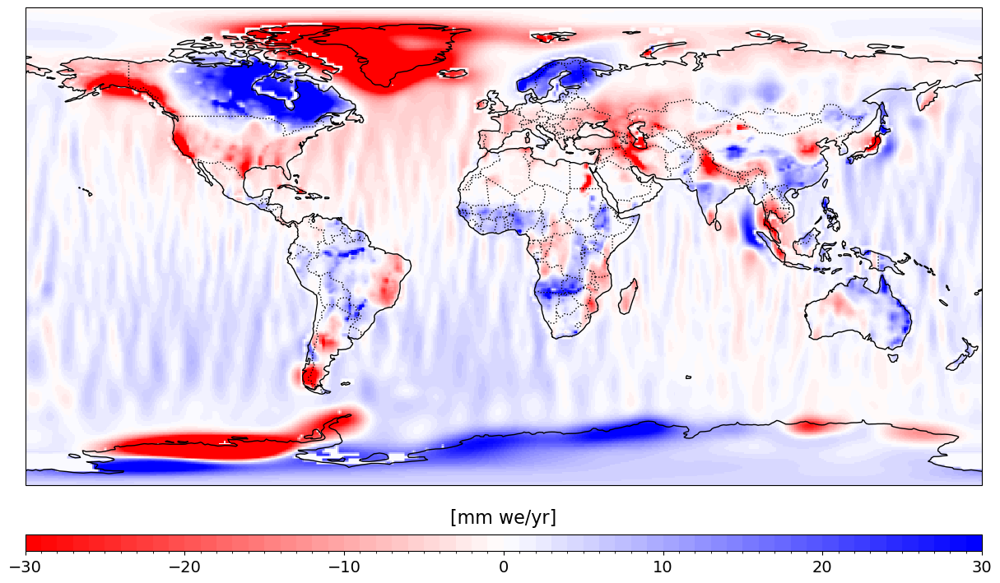

In [149]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm, BoundaryNorm
import matplotlib.colors as mcolors

# Select dataset variable
tws_hhu = ds_trend['trend']  # TWSA_timeseries_025deg_with_love_csr.nc

# ----- 1. Define levels (discrete classes) -----
vmin = -30
vmax = 30
step = 1  # choose your bin size [mm we/yr]

levels = np.arange(vmin, vmax + step, step)  # [-25, -20, ..., 25]

# ----- 2. Build a discrete colormap centered on 0 -----
# Use a continuous diverging colormap, but discretize it
base_cmap = plt.cm.get_cmap('bwr_r')
ncolors = len(levels) - 1
cmap_discrete = base_cmap(np.linspace(0, 1, ncolors))
cmap_discrete = mcolors.ListedColormap(cmap_discrete)

# Use BoundaryNorm to make discrete bins
norm = BoundaryNorm(boundaries=levels, ncolors=cmap_discrete.N, clip=True)

# If you insist on TwoSlopeNorm behavior (different slopes around 0),
# you can skip BoundaryNorm and just use levels for the colorbar ticks,
# but then the colorbar will still be continuous. For *truly discrete*
# bands, BoundaryNorm is the right choice. [web:18][web:4]

# ----- 3. Plot -----
fig, ax = plt.subplots(figsize=(15, 10),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap=cmap_discrete,
    norm=norm,                     # <- discrete mapping
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.set_title('Improved point mass solution - TWS Anomaly (April 2002)',
#             fontsize=20, pad=15)

# ----- 4. Discrete colorbar below map -----
pos = ax.get_position()
cbar_left = pos.x0
cbar_width = pos.width * 1
cbar_bottom = pos.y0 - 0.08
cbar_height = 0.02

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

# Major ticks at some subset of levels (here every 10 mm)
major_ticks = [v for v in levels if v % 10 == 0]

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal',
    boundaries=levels,
    ticks=major_ticks,
    spacing='uniform'  # equal-sized color segments
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

------
------

## Plotting VLM EWH field only

In [16]:
EWH_trend_vlm = xr.open_dataset('delta_sigma_full_grids.nc') 
EWH_trend_vlm

<xarray.Dataset> Size: 8MB
Dimensions:      (latitude: 720, longitude: 1440)
Coordinates:
  * latitude     (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude    (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
Data variables:
    delta_sigma  (latitude, longitude) float64 8MB ...

C:\Users\sudur\AppData\Local\Temp\ipykernel_6824\3549917493.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = plt.cm.get_cmap('bwr')


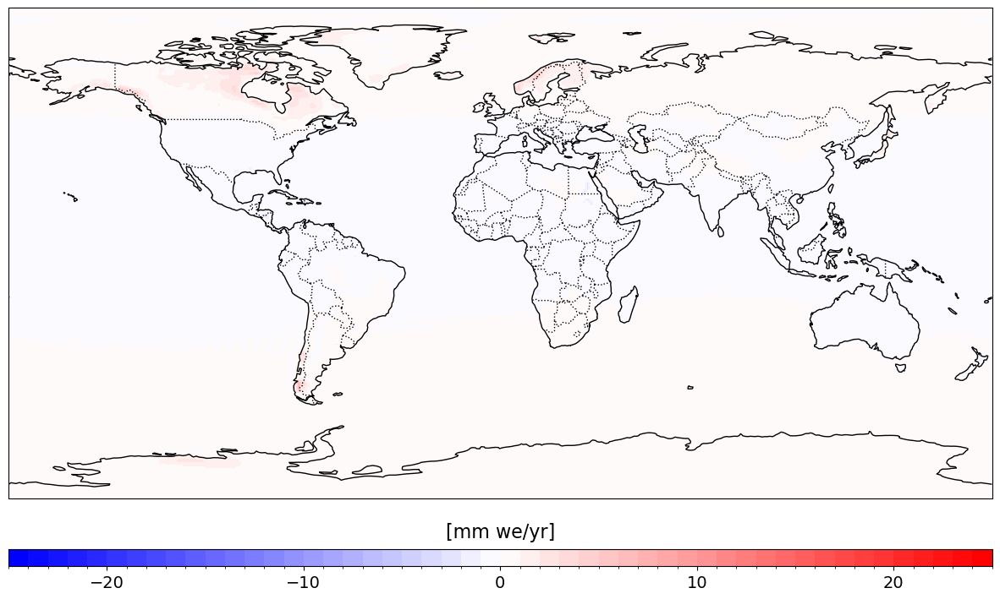

In [16]:
# Select dataset variable
tws_hhu = scaled_EWH_trend_vlm   # TWSA_timeseries_025deg_with_love_csr.nc

# ----- 1. Define levels (discrete classes) -----
vmin = -25
vmax = 25
step = 1  # choose your bin size [mm we/yr]

levels = np.arange(vmin, vmax + step, step)  # [-25, -20, ..., 25]

# ----- 2. Build a discrete colormap centered on 0 -----
# Use a continuous diverging colormap, but discretize it
base_cmap = plt.cm.get_cmap('bwr')
ncolors = len(levels) - 1
cmap_discrete = base_cmap(np.linspace(0, 1, ncolors))
cmap_discrete = mcolors.ListedColormap(cmap_discrete)

# Use BoundaryNorm to make discrete bins
norm = BoundaryNorm(boundaries=levels, ncolors=cmap_discrete.N, clip=True)

# If you insist on TwoSlopeNorm behavior (different slopes around 0),
# you can skip BoundaryNorm and just use levels for the colorbar ticks,
# but then the colorbar will still be continuous. For *truly discrete*
# bands, BoundaryNorm is the right choice. [web:18][web:4]

# ----- 3. Plot -----
fig, ax = plt.subplots(figsize=(15, 10),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap=cmap_discrete,
    norm=norm,                     # <- discrete mapping
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.set_title('Improved point mass solution - TWS Anomaly (April 2002)',
#             fontsize=20, pad=15)

# ----- 4. Discrete colorbar below map -----
pos = ax.get_position()
cbar_left = pos.x0
cbar_width = pos.width * 1
cbar_bottom = pos.y0 - 0.08
cbar_height = 0.02

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

# Major ticks at some subset of levels (here every 10 mm)
major_ticks = [v for v in levels if v % 10 == 0]

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal',
    boundaries=levels,
    ticks=major_ticks,
    spacing='uniform'  # equal-sized color segments
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

-----
-----

## correct_VLM_treatament

In [17]:
ds = xr.open_dataset(r'JPLscaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed.nc') #SE_corrected_Total_TWS_full_range.nc #Total_SE_corrected_GARCE_feild_without_leakage.nc
ds

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [18]:
# ds.lwe_thickness.values

In [19]:
ds = ds.rename({'lwe_thickness': 'tws'})
ds

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [20]:
ds['tws'] = ds['tws'] * 1000.0
ds['tws'].attrs['units'] = 'mm w.e'
ds['tws'].attrs['description'] = 'Total Water Storage anomaly (mm)'
ds

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -11.42 -11.43 -11.45 ... 97.95 97.93

In [21]:
full_grace_tws_correct_VLM_treatament = ds.tws
full_grace_tws_correct_VLM_treatament

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-11.41796271, -11.43244762, -11.44695051, ..., -11.37463959,
         -11.38905778, -11.40349912],
        [-10.17363251, -10.22821469, -10.2827738 , ..., -10.00983131,
         -10.06443325, -10.11903606],
        [ -8.08073862,  -8.1969816 ,  -8.31291138, ...,  -7.73034543,
          -7.84739709,  -7.96420232],
        ...,
        [-91.73872105, -91.62059597, -91.50245791, ..., -92.09293827,
         -91.97489374, -91.85682173],
        [-88.50572655, -88.43237427, -88.35899503, ..., -88.72557513,
         -88.65233044, -88.57904788],
        [-86.12350168, -86.09734811, -86.0711673 , ..., -86.20179752,
         -86.17573022, -86.14963287]],

       [[-14.59023542, -14.60013296, -14.61003705, ..., -14.56060011,
         -14.57046905, -14.58034779],
        [-13.68025843, -13.72176774, -13.76323916, ..., -13.55557892,
         -13.59715648, -13.63871904],
        [-11.84987967, -11.94448178, -12.03884111, ..., -11.56480771,
         -11.66002311, -11.75505265],
...
        [ 86.61049767,  86.5845263 ,  86.55883374, ...,  86.69019743,
          86.66331   ,  86.63675276],
        [ 85.66211238,  85.63057075,  85.59910528, ...,  85.75722601,
          85.72543647,  85.69373374],
        [ 85.18865647,  85.17302997,  85.15742941, ...,  85.2356644 ,
          85.21997562,  85.20430694]],

       [[-36.62418997, -36.60500104, -36.58577935, ..., -36.68153405,
         -36.66245681, -36.64334105],
        [-37.88598741, -37.81796583, -37.74991919, ..., -38.08983252,
         -38.02192855, -37.95397711],
        [-39.6509334 , -39.51539422, -39.3800614 , ..., -40.05861244,
         -39.92256424, -39.78666398],
        ...,
        [ 99.00485142,  98.97343086,  98.94221815, ...,  99.10045873,
          99.06834304,  99.03648267],
        [ 98.28082195,  98.24704599,  98.21333251, ...,  98.38258699,
          98.34859083,  98.31467159],
        [ 97.91443516,  97.89828972,  97.88217021, ...,  97.96299199,
          97.94678823,  97.93060261]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:        mm w.e
    description:  Total Water Storage anomaly (mm)

In [22]:
import numpy as np
import xarray as xr

# -----------------------------
# 1) Time -> decimal years
# -----------------------------
time_index = full_grace_tws_correct_VLM_treatament.time.to_index()

time_decimal = (
    time_index.year +
    time_index.dayofyear / 365.25
)

time_decimal = time_decimal - time_decimal[0]
t = time_decimal.values
N = len(t)

# ---------------------------------
# 2) Build design matrix A (OLS)
# ---------------------------------
A = np.column_stack([
    np.ones(N),                 # constant
    t,                          # linear trend
    np.sin(2*np.pi*t),          # annual sine
    np.cos(2*np.pi*t),          # annual cosine
    np.sin(4*np.pi*t),          # semi-annual sine
    np.cos(4*np.pi*t)           # semi-annual cosine
])

# Precompute for performance
A_T_A_inv = np.linalg.inv(A.T @ A)
A_pinv = A_T_A_inv @ A.T

# Prepare output trend array
nlat = len(full_grace_tws_correct_VLM_treatament.lat)
nlon = len(full_grace_tws_correct_VLM_treatament.lon)
trend_map = np.full((nlat, nlon), np.nan)

# --------------------------------------------------
# 3) Loop over grid cells -> OLS fit, extract trend
# --------------------------------------------------
for i in range(nlat):
    for j in range(nlon):

        y = full_grace_tws_correct_VLM_treatament[:, i, j].values

        # Skip if all NaNs
        if np.all(np.isnan(y)):
            continue

        mask = np.isfinite(y)
        if mask.sum() < 6:  # need at least 6 samples
            continue

        y_valid = y[mask]
        A_valid = A[mask]

        # OLS
        try:
            params = np.linalg.lstsq(A_valid, y_valid, rcond=None)[0]
            trend_map[i, j] = params[1]  # linear trend [mm/year]
        except:
            continue

# Build DataArray trend
da_trend = xr.DataArray(
    trend_map,
    dims=('lat','lon'),
    coords={'lat': full_grace_tws_correct_VLM_treatament.lat,
            'lon': full_grace_tws_correct_VLM_treatament.lon},
    name='tws_linear_trend'
)

da_trend.attrs['units'] = 'mm/year'
da_trend.attrs['description'] = 'Linear trend of TWS anomaly'

ds_trend_correct_VLM_treatment = xr.Dataset({'trend': da_trend})

ds_trend_correct_VLM_treatment

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -1.415 -1.413 -1.411 ... 12.36 12.35 12.35

C:\Users\sudur\AppData\Local\Temp\ipykernel_10644\182577631.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = plt.cm.get_cmap('bwr_r')


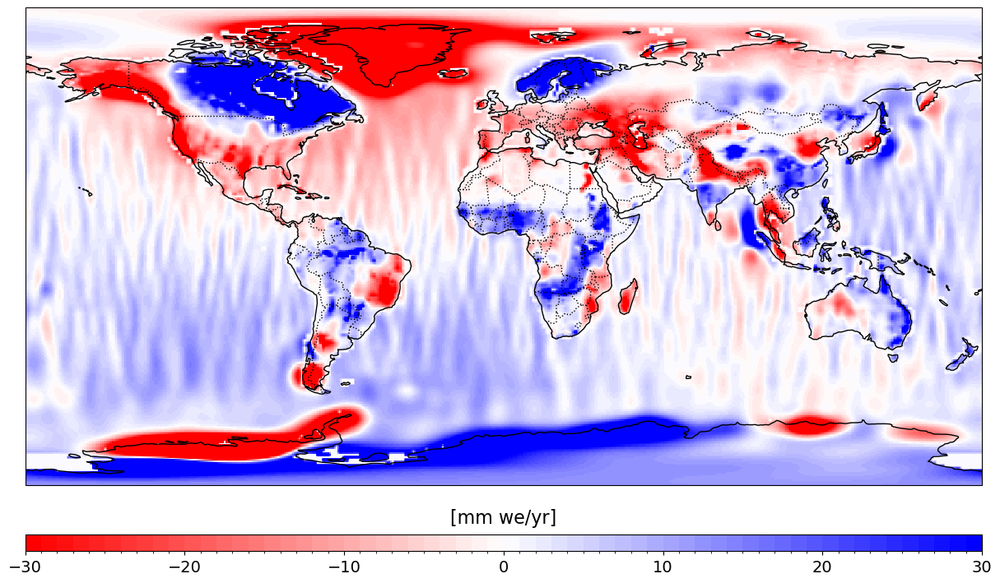

In [160]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm, BoundaryNorm
import matplotlib.colors as mcolors

# Select dataset variable
tws_hhu = ds_trend_correct_VLM_treatment['trend']  # TWSA_timeseries_025deg_with_love_csr.nc

# ----- 1. Define levels (discrete classes) -----
vmin = -30
vmax = 30
step = 1  # choose your bin size [mm we/yr]

levels = np.arange(vmin, vmax + step, step)  # [-25, -20, ..., 25]

# ----- 2. Build a discrete colormap centered on 0 -----
# Use a continuous diverging colormap, but discretize it
base_cmap = plt.cm.get_cmap('bwr_r')
ncolors = len(levels) - 1
cmap_discrete = base_cmap(np.linspace(0, 1, ncolors))
cmap_discrete = mcolors.ListedColormap(cmap_discrete)

# Use BoundaryNorm to make discrete bins
norm = BoundaryNorm(boundaries=levels, ncolors=cmap_discrete.N, clip=True)

# If you insist on TwoSlopeNorm behavior (different slopes around 0),
# you can skip BoundaryNorm and just use levels for the colorbar ticks,
# but then the colorbar will still be continuous. For *truly discrete*
# bands, BoundaryNorm is the right choice. [web:18][web:4]

# ----- 3. Plot -----
fig, ax = plt.subplots(figsize=(15, 10),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap=cmap_discrete,
    norm=norm,                     # <- discrete mapping
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.set_title('Improved point mass solution - TWS Anomaly (April 2002)',
#             fontsize=20, pad=15)

# ----- 4. Discrete colorbar below map -----
pos = ax.get_position()
cbar_left = pos.x0
cbar_width = pos.width * 1
cbar_bottom = pos.y0 - 0.08
cbar_height = 0.02

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

# Major ticks at some subset of levels (here every 10 mm)
major_ticks = [v for v in levels if v % 10 == 0]

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal',
    boundaries=levels,
    ticks=major_ticks,
    spacing='uniform'  # equal-sized color segments
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

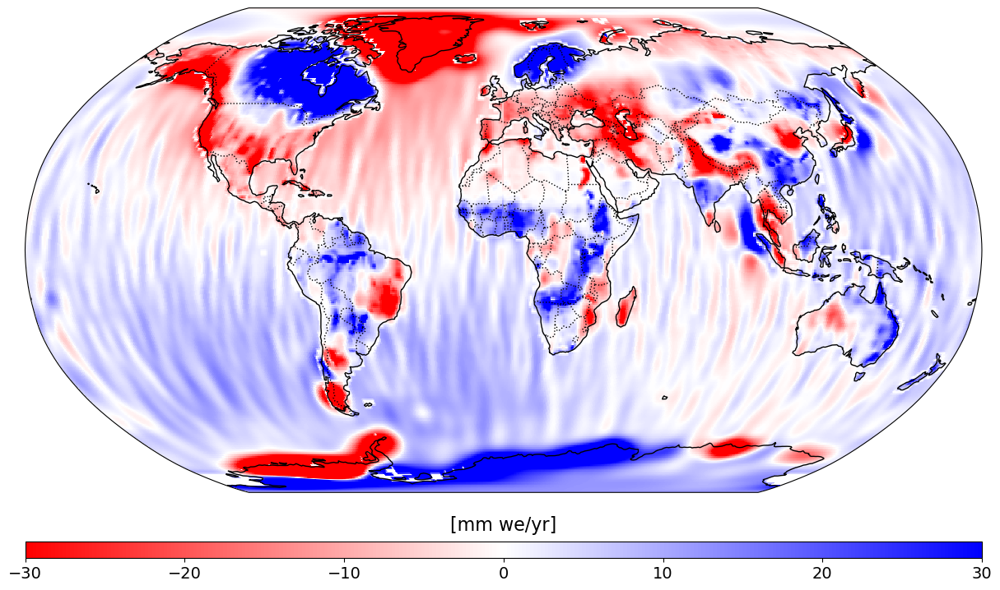

In [161]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = ds_trend_correct_VLM_treatment['trend']

# ----- 1. Define limits -----
vmin = -30
vmax = 30

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.Robinson()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='bwr_r',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

---------

## Without kn secular VLM EWH Field

In [23]:
ds_without_kn_VLM = xr.open_dataset(r'JPLscaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed_without_kn_in_VLM.nc') #SE_corrected_Total_TWS_full_range.nc #Total_SE_corrected_GARCE_feild_without_leakage.nc
ds_without_kn_VLM 

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [24]:
ds_without_kn_VLM = ds_without_kn_VLM.rename({'lwe_thickness': 'tws'})
ds_without_kn_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [25]:
ds_without_kn_VLM['tws'] = ds_without_kn_VLM['tws'] * 1000.0
ds_without_kn_VLM['tws'].attrs['units'] = 'mm w.e'
ds_without_kn_VLM['tws'].attrs['description'] = 'Total Water Storage anomaly (mm)'
ds_without_kn_VLM

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -14.73 -14.75 -14.76 ... 100.1 100.1

In [26]:
grace_without_kn_VLM = ds_without_kn_VLM.tws
grace_without_kn_VLM

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-14.72946824, -14.74601387, -14.76261812, ..., -14.68020548,
         -14.69656317, -14.71298454],
        [-12.99692852, -13.05713642, -13.11754018, ..., -12.81758099,
         -12.87714177, -12.93692727],
        [-10.64246942, -10.77060575, -10.8990794 , ..., -10.26037189,
         -10.38732321, -10.51469856],
        ...,
        [-81.60434024, -81.50265059, -81.40129233, ..., -81.91143225,
         -81.80872443, -81.70636191],
        [-79.96855666, -79.90470503, -79.84106462, ..., -80.16133738,
         -80.09687111, -80.03261172],
        [-79.42773153, -79.40545976, -79.3832377 , ..., -79.4948601 ,
         -79.47243171, -79.45005679]],

       [[-19.52085631, -19.52686249, -19.53291469, ..., -19.50312581,
         -19.50898758, -19.51489851],
        [-17.43858986, -17.47095433, -17.5034203 , ..., -17.34216796,
         -17.37418958, -17.40633288],
        [-14.46460095, -14.55013303, -14.63571841, ..., -14.20854328,
         -14.29378498, -14.37914447],
...
        [ 89.71576407,  89.68036063,  89.64528973, ...,  89.82402048,
          89.78758126,  89.75149556],
        [ 88.96833466,  88.93794466,  88.90768352, ...,  89.06025612,
          89.02948491,  88.99884562],
        [ 88.77562018,  88.76220787,  88.74882933, ...,  88.81605949,
          88.8025422 ,  88.78906624]],

       [[-31.67252729, -31.64973416, -31.62689092, ..., -31.74059605,
         -31.71796071, -31.69527157],
        [-33.21874362, -33.14179204, -33.06478434, ..., -33.44921777,
         -33.37246556, -33.29563975],
        [-34.9017669 , -34.7553044 , -34.60897436, ..., -35.34176518,
         -35.19501591, -35.04834543],
        ...,
        [100.76647143, 100.72420324, 100.68218487, ..., 100.89482948,
         100.85177753, 100.80898872],
        [100.17521876, 100.14220618, 100.10928092, ..., 100.27478549,
         100.24150486, 100.20831843],
        [100.04808685, 100.03403969, 100.0200226 , ..., 100.09040464,
         100.07626744, 100.06216404]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:        mm w.e
    description:  Total Water Storage anomaly (mm)

In [27]:
import numpy as np
import xarray as xr

# -----------------------------
# 1) Time -> decimal years
# -----------------------------
time_index = grace_without_kn_VLM.time.to_index()

time_decimal = (
    time_index.year +
    time_index.dayofyear / 365.25
)

time_decimal = time_decimal - time_decimal[0]
t = time_decimal.values
N = len(t)

# ---------------------------------
# 2) Build design matrix A (OLS)
# ---------------------------------
A = np.column_stack([
    np.ones(N),                 # constant
    t,                          # linear trend
    np.sin(2*np.pi*t),          # annual sine
    np.cos(2*np.pi*t),          # annual cosine
    np.sin(4*np.pi*t),          # semi-annual sine
    np.cos(4*np.pi*t)           # semi-annual cosine
])

# Precompute for performance
A_T_A_inv = np.linalg.inv(A.T @ A)
A_pinv = A_T_A_inv @ A.T

# Prepare output trend array
nlat = len(grace_without_kn_VLM.lat)
nlon = len(grace_without_kn_VLM.lon)
trend_map = np.full((nlat, nlon), np.nan)

# --------------------------------------------------
# 3) Loop over grid cells -> OLS fit, extract trend
# --------------------------------------------------
for i in range(nlat):
    for j in range(nlon):

        y = grace_without_kn_VLM[:, i, j].values

        # Skip if all NaNs
        if np.all(np.isnan(y)):
            continue

        mask = np.isfinite(y)
        if mask.sum() < 6:  # need at least 6 samples
            continue

        y_valid = y[mask]
        A_valid = A[mask]

        # OLS
        try:
            params = np.linalg.lstsq(A_valid, y_valid, rcond=None)[0]
            trend_map[i, j] = params[1]  # linear trend [mm/year]
        except:
            continue

# Build DataArray trend
da_trend_VLM = xr.DataArray(
    trend_map,
    dims=('lat','lon'),
    coords={'lat': grace_without_kn_VLM.lat,
            'lon': grace_without_kn_VLM.lon},
    name='tws_linear_trend'
)

da_trend_VLM.attrs['units'] = 'mm/year'
da_trend_VLM.attrs['description'] = 'Linear trend of TWS anomaly'

ds_trend_grace_without_kn_secular_VLM_EWH_field = xr.Dataset({'trend': da_trend_VLM})

ds_trend_grace_without_kn_secular_VLM_EWH_field

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -0.4485 -0.4464 -0.4443 ... 11.23 11.23

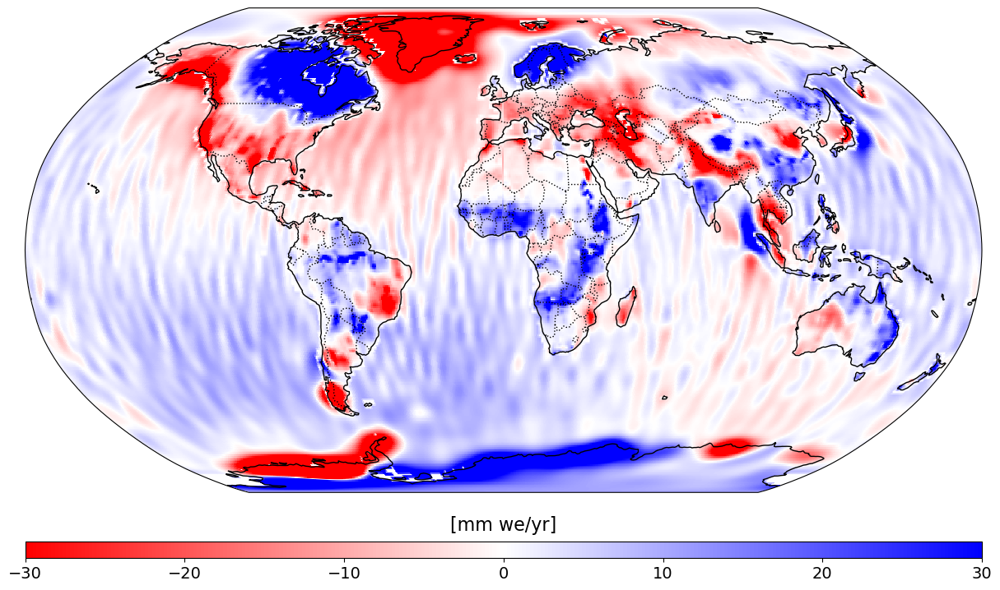

In [167]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = ds_trend_grace_without_kn_secular_VLM_EWH_field['trend']

# ----- 1. Define limits -----
vmin = -30
vmax = 30

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.Robinson()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='bwr_r',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

--------

## with_kn_SecularGRACE_EWH_Field

In [28]:
ds_with_kn = xr.open_dataset(r'JPLscaled_grace_tws_meters_solid_earth_corrected_scaled_usingCLM4_renamed_with_kn_SecularGRACEEWHField.nc') #SE_corrected_Total_TWS_full_range.nc #Total_SE_corrected_GARCE_feild_without_leakage.nc
ds_with_kn

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [29]:
ds_with_kn = ds_with_kn.rename({'lwe_thickness': 'tws'})
ds_with_kn

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [30]:
ds_with_kn['tws'] = ds_with_kn['tws'] * 1000.0
ds_with_kn['tws'].attrs['units'] = 'mm w.e'
ds_with_kn['tws'].attrs['description'] = 'Total Water Storage anomaly (mm)'
ds_with_kn

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB -0.9869 -1.006 ... 105.5 105.5

In [31]:
grace_with_kn_secular_field = ds_with_kn.tws
grace_with_kn_secular_field

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[ -0.98687452,  -1.00586548,  -1.02491285, ...,  -0.93026387,
          -0.94907267,  -0.96794408],
        [  0.82105129,   0.75259227,   0.68393105, ...,   1.02509792,
           0.95731359,   0.88929466],
        [  3.52533794,   3.38180914,   3.23787322, ...,   3.95316928,
           3.81104881,   3.66842841],
        ...,
        [-86.28557878, -86.18944844, -86.09349836, ..., -86.57511071,
         -86.4784074 , -86.38189823],
        [-84.17173112, -84.11285548, -84.05412502, ..., -84.349182  ,
         -84.28989265, -84.23074138],
        [-83.23867522, -83.21836987, -83.1981032 , ..., -83.29981923,
         -83.27939855, -83.25901756]],

       [[ -5.97458537,  -5.98300194,  -5.99146235, ...,  -5.94961192,
          -5.9578898 ,  -5.96621578],
        [ -3.81800976,  -3.85850748,  -3.89911295, ...,  -3.6972416 ,
          -3.73736929,  -3.7776284 ],
        [ -0.49919083,  -0.5998955 ,  -0.70072226, ...,  -0.1980527 ,
          -0.29824684,  -0.3986336 ],
...
        [ 96.30070629,  96.27312294,  96.24565954, ...,  96.38426151,
          96.35626864,  96.32841666],
        [ 94.88080006,  94.85740964,  94.83405515, ...,  94.95115756,
          94.92766855,  94.90421468],
        [ 94.13634764,  94.12570142,  94.11507347, ...,  94.16836866,
          94.15767555,  94.14700439]],

       [[-51.19355445, -51.16728779, -51.14097417, ..., -51.27206074,
         -51.24594364, -51.21977427],
        [-52.84685493, -52.75818284, -52.66944561, ..., -53.11241357,
         -53.02398001, -52.93545881],
        [-55.02679993, -54.85847278, -54.69017896, ..., -55.53176198,
         -55.36346531, -55.1951396 ],
        ...,
        [107.41605932, 107.381688  , 107.34735182, ..., 107.51947369,
         107.484951  , 107.45047675],
        [106.145728  , 106.1197837 , 106.09383291, ..., 106.22351907,
         106.19759212, 106.17166166],
        [105.46144163, 105.45018772, 105.43894821, ..., 105.49525848,
         105.48397318, 105.47270213]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:        mm w.e
    description:  Total Water Storage anomaly (mm)

In [32]:
import numpy as np
import xarray as xr

# -----------------------------
# 1) Time -> decimal years
# -----------------------------
time_index = grace_with_kn_secular_field.time.to_index()

time_decimal = (
    time_index.year +
    time_index.dayofyear / 365.25
)

time_decimal = time_decimal - time_decimal[0]
t = time_decimal.values
N = len(t)

# ---------------------------------
# 2) Build design matrix A (OLS)
# ---------------------------------
A = np.column_stack([
    np.ones(N),                 # constant
    t,                          # linear trend
    np.sin(2*np.pi*t),          # annual sine
    np.cos(2*np.pi*t),          # annual cosine
    np.sin(4*np.pi*t),          # semi-annual sine
    np.cos(4*np.pi*t)           # semi-annual cosine
])

# Precompute for performance
A_T_A_inv = np.linalg.inv(A.T @ A)
A_pinv = A_T_A_inv @ A.T

# Prepare output trend array
nlat = len(grace_with_kn_secular_field.lat)
nlon = len(grace_with_kn_secular_field.lon)
trend_map = np.full((nlat, nlon), np.nan)

# --------------------------------------------------
# 3) Loop over grid cells -> OLS fit, extract trend
# --------------------------------------------------
for i in range(nlat):
    for j in range(nlon):

        y = grace_with_kn_secular_field[:, i, j].values

        # Skip if all NaNs
        if np.all(np.isnan(y)):
            continue

        mask = np.isfinite(y)
        if mask.sum() < 6:  # need at least 6 samples
            continue

        y_valid = y[mask]
        A_valid = A[mask]

        # OLS
        try:
            params = np.linalg.lstsq(A_valid, y_valid, rcond=None)[0]
            trend_map[i, j] = params[1]  # linear trend [mm/year]
        except:
            continue

# Build DataArray trend
da_trend = xr.DataArray(
    trend_map,
    dims=('lat','lon'),
    coords={'lat': grace_with_kn_secular_field.lat,
            'lon': grace_with_kn_secular_field.lon},
    name='tws_linear_trend'
)

da_trend.attrs['units'] = 'mm/year'
da_trend.attrs['description'] = 'Linear trend of TWS anomaly'

ds_trend_grace_with_kn_secular_field = xr.Dataset({'trend': da_trend})

ds_trend_grace_with_kn_secular_field

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -2.839 -2.836 -2.834 ... 11.9 11.9 11.89

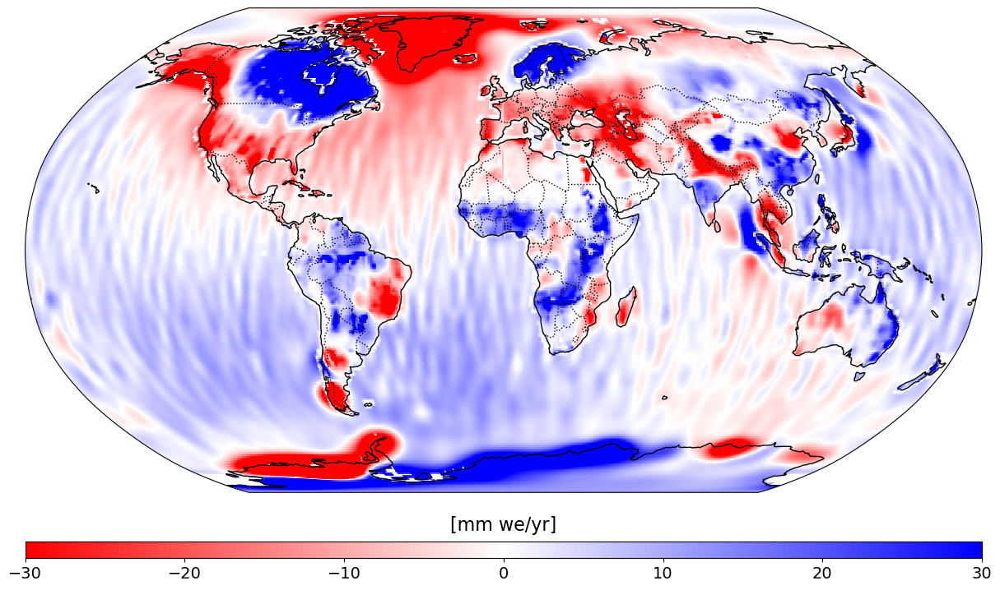

In [173]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = ds_trend_grace_with_kn_secular_field['trend']

# ----- 1. Define limits -----
vmin = -30
vmax = 30

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.Robinson()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='bwr_r',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

--------
------

## Quantifying Errror due to the inclusion of the load Love number in the Secular GRACE EWH Field

In [174]:
# diff_rigid_vlm = (corrected_ds_rigid_earth1['tws_trend'] - EWH_trend_vlm['tws_trend'])
# # Optionally reconstruct DataArray after subtraction:
# diff_rigid_vlm_xr = xr.DataArray(
#     diff_rigid_vlm,
#     coords=corrected_ds_rigid_earth1['tws_trend'].coords,
#     dims=corrected_ds_rigid_earth1['tws_trend'].dims,
#     attrs=corrected_ds_rigid_earth1['tws_trend'].attrs
# )
# diff_rigid_vlm_xr

In [33]:
ds_trend_grace_with_kn_secular_field   #inclusion of the load Love number in the Secular GRACE EWH Field

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -2.839 -2.836 -2.834 ... 11.9 11.9 11.89

In [34]:
ds_trend_correct_VLM_treatment

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -1.415 -1.413 -1.411 ... 12.36 12.35 12.35

In [35]:
errror_inclusion_kn_Secular_GRACE_EWH = (ds_trend_grace_with_kn_secular_field['trend'] - ds_trend_correct_VLM_treatment['trend'])
# Optionally reconstruct DataArray after subtraction:
errror_inclusion_kn_Secular_GRACE_EWH_xr = xr.DataArray(
    errror_inclusion_kn_Secular_GRACE_EWH,
    coords=ds_trend_correct_VLM_treatment['trend'].coords,
    dims=ds_trend_correct_VLM_treatment['trend'].dims,
    attrs=ds_trend_correct_VLM_treatment['trend'].attrs
)
errror_inclusion_kn_Secular_GRACE_EWH_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[-1.42337218, -1.42292779, -1.42248028, ..., -1.42468583,
        -1.42425116, -1.42381318],
       [-1.50347435, -1.50210484, -1.50072888, ..., -1.50754182,
        -1.50619289, -1.504837  ],
       [-1.56226608, -1.55989132, -1.55751259, ..., -1.56936283,
        -1.567002  , -1.56463634],
       ...,
       [-0.50424981, -0.5059044 , -0.50755381, ..., -0.49924119,
        -0.50091735, -0.5025874 ],
       [-0.48869551, -0.48984877, -0.49099644, ..., -0.48520447,
        -0.48637355, -0.48753724],
       [-0.45953085, -0.45993654, -0.46034063, ..., -0.45830471,
        -0.45871513, -0.45912402]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        mm/year
    description:  Linear trend of TWS anomaly

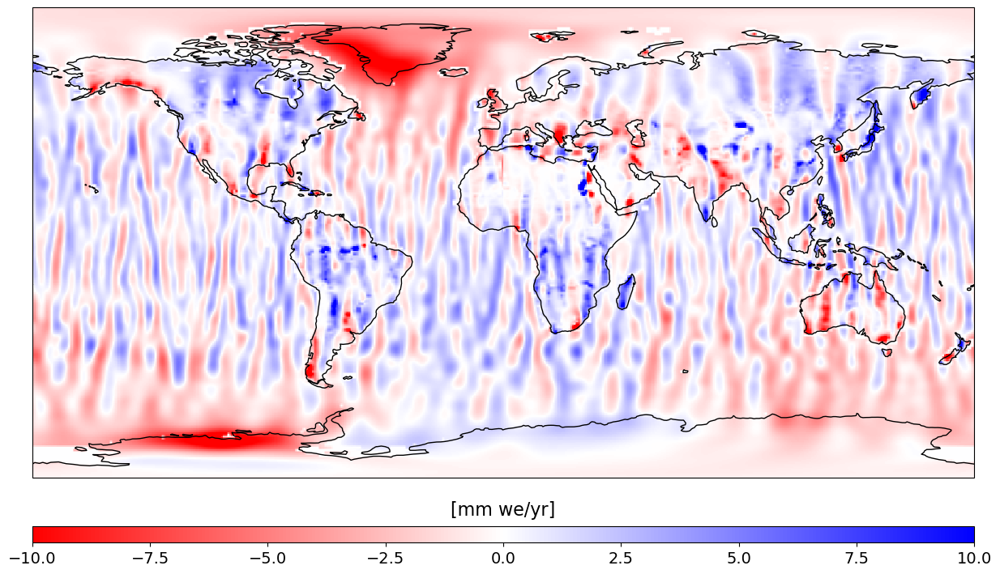

In [178]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = errror_inclusion_kn_Secular_GRACE_EWH_xr

# ----- 1. Define limits -----
vmin = -10
vmax = 10

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='bwr_r',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

-------
------

## Qualntifying this error: errror_inclusion_kn_Secular_GRACE_EWH_xr in percentage

In [36]:
errror_inclusion_kn_Secular_GRACE_EWH_percentage = (errror_inclusion_kn_Secular_GRACE_EWH_xr * 100) / (ds_trend_correct_VLM_treatment['trend'])
errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr = xr.DataArray(
    errror_inclusion_kn_Secular_GRACE_EWH_percentage,
    coords=ds_trend_correct_VLM_treatment['trend'].coords,
    dims=ds_trend_correct_VLM_treatment['trend'].dims,
    attrs=ds_trend_correct_VLM_treatment['trend'].attrs
)
errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[100.56842349, 100.68502181, 100.80185752, ..., 100.22007324,
        100.33592966, 100.45204451],
       [ 98.991742  ,  99.4036546 ,  99.8190333 , ...,  97.77678058,
         98.17829271,  98.58327975],
       [ 91.67860034,  92.40184797,  93.13696608, ...,  89.57826928,
         90.2669738 ,  90.96702803],
       ...,
       [ -3.93222508,  -3.94691081,  -3.96157741, ...,  -3.88794857,
         -3.90273741,  -3.91750011],
       [ -3.89140725,  -3.90167309,  -3.91190561, ...,  -3.86042755,
         -3.87078592,  -3.88111262],
       [ -3.7202791 ,  -3.72396205,  -3.7276339 , ...,  -3.70916876,
         -3.71288403,  -3.71658889]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        mm/year
    description:  Linear trend of TWS anomaly

In [37]:
# absolute values (cell-wise) of the percentage differences
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs = np.abs(
    errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr
)

# wrap as DataArray with same coords/dims and updated attrs
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr = xr.DataArray(
    errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs,
    coords=errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr.coords,
    dims=errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr.dims,
    attrs=errror_inclusion_kn_Secular_GRACE_EWH_percentage_xr.attrs,
)
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr.attrs["units"] = "%"
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr.attrs["description"] = (
    "Absolute percentage difference between kn-secular and correct VLM GRACE EWH trends"
)

errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[100.56842349, 100.68502181, 100.80185752, ..., 100.22007324,
        100.33592966, 100.45204451],
       [ 98.991742  ,  99.4036546 ,  99.8190333 , ...,  97.77678058,
         98.17829271,  98.58327975],
       [ 91.67860034,  92.40184797,  93.13696608, ...,  89.57826928,
         90.2669738 ,  90.96702803],
       ...,
       [  3.93222508,   3.94691081,   3.96157741, ...,   3.88794857,
          3.90273741,   3.91750011],
       [  3.89140725,   3.90167309,   3.91190561, ...,   3.86042755,
          3.87078592,   3.88111262],
       [  3.7202791 ,   3.72396205,   3.7276339 , ...,   3.70916876,
          3.71288403,   3.71658889]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        %
    description:  Absolute percentage difference between kn-secular and corre...

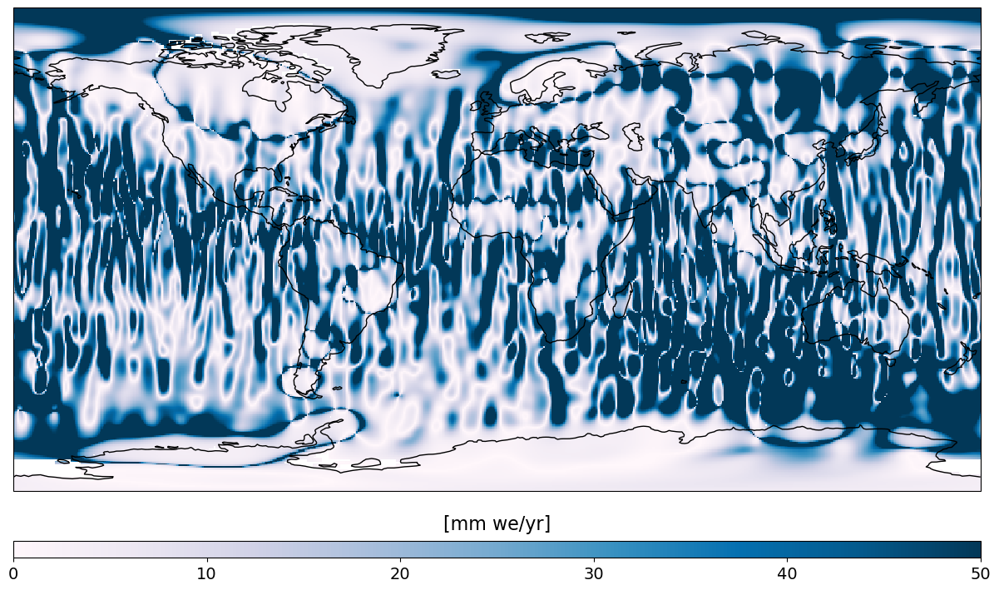

In [181]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr

# ----- 1. Define limits -----
vmin = 0
vmax = 50

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=25, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='PuBu',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

------
------

In [38]:
scaled_EWH_trend_vlm 

<xarray.DataArray (lat: 360, lon: 720)> Size: 2MB
array([[0.13108905, 0.13110169, 0.13111442, ..., 0.13105173, 0.13106407,
        0.13107651],
       [0.13567853, 0.1357921 , 0.13590587, ..., 0.13533942, 0.13545216,
        0.13556521],
       [0.14977732, 0.15003043, 0.15028274, ..., 0.1490139 , 0.14926897,
        0.14952347],
       ...,
       [0.00489513, 0.0055041 , 0.00611482, ..., 0.00308165, 0.00368361,
        0.0042882 ],
       [0.006875  , 0.00718698, 0.00749893, ..., 0.00594   , 0.00625141,
        0.00656311],
       [0.00779485, 0.00788035, 0.00796573, ..., 0.00753793, 0.00762362,
        0.00770927]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5

In [66]:
# 1. Convert DataArray to named Dataset FIRST
scaled_EWH_trend_vlm = scaled_EWH_trend_vlm.to_dataset(name='trend')

In [68]:
# 2. NOW save to NetCDF
scaled_EWH_trend_vlm.to_netcdf('scaled_EWH_trend_vlm1.nc')

In [39]:
# 3. Reload - will have proper name!
scaled_EWH_trend_vlm = xr.open_dataset('scaled_EWH_trend_vlm.nc')
scaled_EWH_trend_vlm

<xarray.Dataset> Size: 2MB
Dimensions:                        (lon: 720, lat: 360)
Coordinates:
  * lon                            (lon) float64 6kB 0.0 0.5 1.0 ... 359.0 359.5
  * lat                            (lat) float64 3kB -90.0 -89.5 ... 89.0 89.5
Data variables:
    __xarray_dataarray_variable__  (lat, lon) float64 2MB ...

In [40]:
scaled_EWH_trend_vlm = scaled_EWH_trend_vlm.rename({'__xarray_dataarray_variable__': 'trend'})
scaled_EWH_trend_vlm

<xarray.Dataset> Size: 2MB
Dimensions:  (lon: 720, lat: 360)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Data variables:
    trend    (lat, lon) float64 2MB ...

------

In [41]:
#full grace tws
ds_trend

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -0.5406 -0.5395 -0.5384 ... 4.557 4.557

------

In [42]:
ds_trend_correct_VLM_treatment

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -1.415 -1.413 -1.411 ... 12.36 12.35 12.35

-----

In [43]:
ds_trend_grace_with_kn_secular_field

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -2.839 -2.836 -2.834 ... 11.9 11.9 11.89

-------

In [44]:
errror_inclusion_kn_Secular_GRACE_EWH_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[-1.42337218, -1.42292779, -1.42248028, ..., -1.42468583,
        -1.42425116, -1.42381318],
       [-1.50347435, -1.50210484, -1.50072888, ..., -1.50754182,
        -1.50619289, -1.504837  ],
       [-1.56226608, -1.55989132, -1.55751259, ..., -1.56936283,
        -1.567002  , -1.56463634],
       ...,
       [-0.50424981, -0.5059044 , -0.50755381, ..., -0.49924119,
        -0.50091735, -0.5025874 ],
       [-0.48869551, -0.48984877, -0.49099644, ..., -0.48520447,
        -0.48637355, -0.48753724],
       [-0.45953085, -0.45993654, -0.46034063, ..., -0.45830471,
        -0.45871513, -0.45912402]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        mm/year
    description:  Linear trend of TWS anomaly

In [169]:
errror_inclusion_kn_Secular_GRACE_EWH_xr.to_netcdf(r'Error_due_to_inclusion_of_kn_in_secular_GRACE_EWH.nc')

In [45]:
errror_in_kn_Secular_GRACE_EWH = xr.open_dataset(r'Error_due_to_inclusion_of_kn_in_secular_GRACE_EWH.nc')
errror_in_kn_Secular_GRACE_EWH

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB ...

------

In [46]:
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[100.56842349, 100.68502181, 100.80185752, ..., 100.22007324,
        100.33592966, 100.45204451],
       [ 98.991742  ,  99.4036546 ,  99.8190333 , ...,  97.77678058,
         98.17829271,  98.58327975],
       [ 91.67860034,  92.40184797,  93.13696608, ...,  89.57826928,
         90.2669738 ,  90.96702803],
       ...,
       [  3.93222508,   3.94691081,   3.96157741, ...,   3.88794857,
          3.90273741,   3.91750011],
       [  3.89140725,   3.90167309,   3.91190561, ...,   3.86042755,
          3.87078592,   3.88111262],
       [  3.7202791 ,   3.72396205,   3.7276339 , ...,   3.70916876,
          3.71288403,   3.71658889]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        %
    description:  Absolute percentage difference between kn-secular and corre...

In [171]:
errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs_xr.to_netcdf(r'Errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs.nc')

In [47]:
errror_in_kn_Secular_GRACE_EWH_percentage = xr.open_dataset(r'Errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs.nc')
errror_in_kn_Secular_GRACE_EWH_percentage
#errror_in_kn_Secular_GRACE_EWH

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB ...

-------

In [48]:
# import matplotlib.pyplot as plt
# import cartopy.crs as ccrs

# proj = ccrs.PlateCarree()

# fig, axes = plt.subplots(
#     nrows=3, ncols=2,
#     subplot_kw={'projection': proj},
#     figsize=(14, 12),
#     constrained_layout=True
# )

# ax11, ax12 = axes[0]
# ax21, ax22 = axes[1]
# ax31, ax32 = axes[2]

# # (1,1): -3 to 3
# EWH_trend_vlm['trend'].plot(
#     ax=ax11,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-3, vmax=3,
#     cbar_kwargs={'label': 'EWH VLM trend (mm/yr)'}
# )
# ax11.coastlines()
# ax11.set_title('Observed VLM EWH trend')

# # (1,2): -30 to 30
# ds_trend['trend'].plot(
#     ax=ax12,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={'label': 'GRACE TWS trend (mm/yr)'}
# )
# ax12.coastlines()
# ax12.set_title('GRACE TWS trend (no VLM)')

# # (2,1): -30 to 30
# ds_trend_correct_VLM_treatment['trend'].plot(
#     ax=ax21,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={'label': 'GRACE TWS trend (mm/yr)'}
# )
# ax21.coastlines()
# ax21.set_title('GRACE TWS trend (correct VLM)')

# # (2,2): choose your own range, e.g. -30 to 30 as well
# ds_trend_grace_with_kn_secular_field['trend'].plot(
#     ax=ax22,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={'label': 'GRACE TWS trend (mm/yr)'}
# )
# ax22.coastlines()
# ax22.set_title('GRACE TWS trend (with kn in secular)')

# # (3,1): -10 to 10
# errror_in_kn_Secular_GRACE_EWH['trend'].plot(
#     ax=ax31,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-10, vmax=10,
#     cbar_kwargs={'label': 'Trend difference (mm/yr)'}
# )
# ax31.coastlines()
# ax31.set_title('Error due to kn in secular (mm/yr)')

# # (3,2): 0 to 50
# errror_in_kn_Secular_GRACE_EWH_percentage['trend'].plot(
#     ax=ax32,
#     transform=proj,
#     cmap='PuBu',
#     vmin=0, vmax=50,
#     cbar_kwargs={'label': 'Error (%)'}
# )
# ax32.coastlines()
# ax32.set_title('Error due to kn in secular (%)')

# plt.show()

In [49]:
# import matplotlib.pyplot as plt
# import cartopy.crs as ccrs

# proj = ccrs.PlateCarree()

# # region bounds
# lat_min, lat_max = -49, 84
# lon_min, lon_max = 0, 180

# # 1) subset each dataset to the region
# EWH_trend_vlm_sub = EWH_trend_vlm.sel(lat=slice(lat_min, lat_max),
#                                       lon=slice(lon_min, lon_max))
# ds_trend_sub = ds_trend.sel(lat=slice(lat_min, lat_max),
#                             lon=slice(lon_min, lon_max))
# ds_trend_correct_sub = ds_trend_correct_VLM_treatment.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# ds_trend_kn_sub = ds_trend_grace_with_kn_secular_field.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# err_abs_sub = errror_in_kn_Secular_GRACE_EWH.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# err_pct_sub = errror_inclusion_kn_Secular_GRACE_EWH_percentage_abs.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )

# # 2) figure and axes
# fig, axes = plt.subplots(
#     nrows=3, ncols=2,
#     subplot_kw={'projection': proj},
#     figsize=(50, 40)
#     # constrained_layout=True,
#     # gridspec_kw={'wspace': 0.1, 'hspace': 0.2}  # Starting values  # Very tight horizontal
# )

# ax11, ax12 = axes[0]
# ax21, ax22 = axes[1]
# ax31, ax32 = axes[2]

# # helper to set common map options
# def setup_ax(ax):
#     ax.coastlines()
#     ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

# # (1,1): EWH_trend_vlm_sub, range -3 to 3
# EWH_trend_vlm['trend'].plot(
#     ax=ax11,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-3, vmax=3,
#     cbar_kwargs={
#         'label': 'EWH VLM trend (mm/yr)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50            # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax11)
# ax11.set_title('Observed VLM EWH trend')

# # (1,2): ds_trend_sub, range -30 to 30
# ds_trend['trend'].plot(
#     ax=ax12,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={
#         'label': 'GRACE TWS trend (mm/yr)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50             # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax12)
# ax12.set_title('GRACE TWS trend (no VLM)')

# # (2,1): ds_trend_correct_sub, range -30 to 30
# ds_trend_correct_VLM_treatment['trend'].plot(
#     ax=ax21,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={
#         'label': 'GRACE TWS trend (mm/yr)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50             # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax21)
# ax21.set_title('GRACE TWS trend (correct VLM)')

# # (2,2): ds_trend_kn_sub, choose e.g. -30 to 30
# ds_trend_grace_with_kn_secular_field['trend'].plot(
#     ax=ax22,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-30, vmax=30,
#     cbar_kwargs={
#         'label': 'GRACE TWS trend (mm/yr)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34, 
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50             # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax22)
# ax22.set_title('GRACE TWS trend (with kn in secular)')

# # (3,1): err_abs_sub, range -10 to 10
# errror_in_kn_Secular_GRACE_EWH['trend'].plot(
#     ax=ax31,
#     transform=proj,
#     cmap='bwr_r',
#     vmin=-10, vmax=10,
#     cbar_kwargs={
#         'label': 'Trend difference (mm/yr)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50             # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax31)
# ax31.set_title('Error due to kn in secular (mm/yr)')

# # (3,2): err_pct_sub, range 0 to 50
# errror_in_kn_Secular_GRACE_EWH_percentage['trend'].plot(
#     ax=ax32,
#     transform=proj,
#     cmap='PuBu',
#     vmin=0, vmax=50,
#     cbar_kwargs={
#         'label': 'Error (%)',
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',     # ← CRITICAL: prevents triangle extensions
#         'aspect': 50             # ← Makes bar compact/closed-looking
#     }
# )
# setup_ax(ax32)
# ax32.set_title('Error due to kn in secular (%)')


# fig.subplots_adjust(wspace=-0.64, hspace=0.02)
# plt.show()

In [50]:
jpl_halfdegree_gms = xr.open_dataset(r'GRCTellus.JPL.200204_202408.GLO.RL06.3M.MSCNv04CRI.nc')
jpl_halfdegree_gms

<xarray.Dataset> Size: 1GB
Dimensions:        (lon: 720, lat: 360, time: 236, bounds: 2)
Coordinates:
  * lon            (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.8 359.2 359.8
  * lat            (lat) float64 3kB -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * time           (time) datetime64[ns] 2kB 2002-04-17T12:00:00 ... 2024-08-...
Dimensions without coordinates: bounds
Data variables:
    lwe_thickness  (time, lat, lon) float64 489MB ...
    uncertainty    (time, lat, lon) float64 489MB ...
    lat_bounds     (lat, bounds) float64 6kB ...
    lon_bounds     (lon, bounds) float64 12kB ...
    time_bounds    (time, bounds) datetime64[ns] 4kB ...
    land_mask      (lat, lon) float64 2MB ...
    scale_factor   (lat, lon) float64 2MB ...
    mascon_ID      (lat, lon) float64 2MB ...
    GAD            (time, lat, lon) float64 489MB ...
Attributes: (12/53)
    Conventions:                   CF-1.6, ACDD-1.3, ISO 8601
    Metadata_Conventions:          Unidata Dataset Discovery v1.0
    standard_name_vocabulary:      NetCDF Climate and Forecast (CF) Metadata ...
    title:                         JPL GRACE and GRACE-FO MASCON RL06.3Mv04 CRI
    summary:                       Monthly gravity solutions from GRACE and G...
    keywords:                      Solid Earth, Geodetics/Gravity, Gravity, l...
    ...                            ...
    C_30_substitution:             TN-14; Loomis et al., 2019, Geophys. Res. ...
    user_note_1:                   The accelerometer on the GRACE-B spacecraf...
    user_note_2:                   The accelerometer on the GRACE-D spacecraf...
    journal_reference:             Watkins, M. M., D. N. Wiese, D.-N. Yuan, C...
    CRI_filter_journal_reference:  Wiese, D. N., F. W. Landerer, and M. M. Wa...
    date_created:                  2024-11-04T07:11:08Z

In [51]:
jpl_land_mask = jpl_halfdegree_gms.land_mask
jpl_land_mask

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

In [52]:
# Assume `ds` is your xarray dataset
ds_jpl = jpl_halfdegree_gms.land_mask  # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = (ds_jpl['lon'] - 0.25) % 360  # Wrap around [0, 360)
shifted_lat = ds_jpl['lat'] - 0.25

# Update the dataset with the corrected coordinates
corrected_ds_jpl = ds_jpl.copy()
corrected_ds_jpl = corrected_ds_jpl.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_jpl = corrected_ds_jpl.sortby('lon')

# Display the corrected dataset
corrected_ds_jpl

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

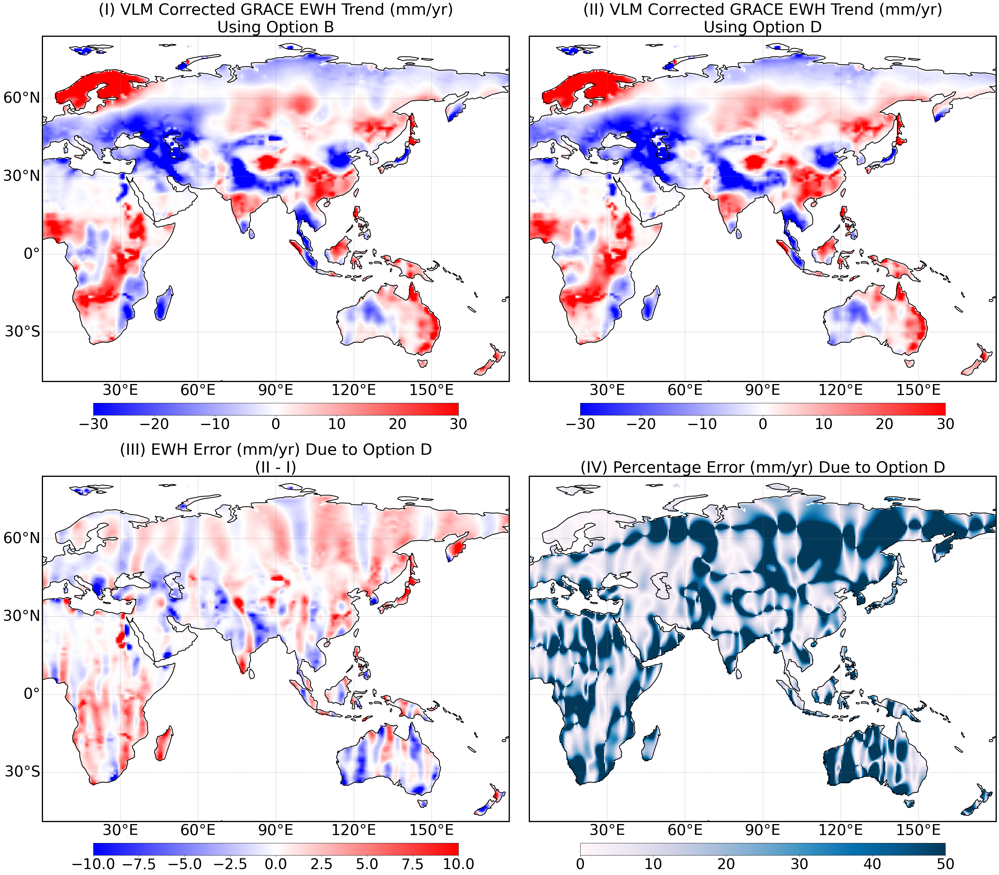

In [82]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker
import matplotlib.cm as cm


# -----------------------------
# GLOBAL FONT SIZE SETTINGS
# -----------------------------
plt.rcParams.update({
    'xtick.labelsize': 45,
    'ytick.labelsize': 45,
    'axes.titlesize': 52,
    'axes.labelsize': 47
})

proj = ccrs.PlateCarree()

# region bounds
lat_min, lat_max = -49, 84
lon_min, lon_max = 0, 180

# # -----------------------------
# # DEFINE LIGHT GRAY FOR MASKED AREAS
# # -----------------------------
# light_gray = '#d9d9d9'

# cmap_bwr = cm.get_cmap('bwr_r').copy()
# # cmap_bwr.set_bad(light_gray)

# cmap_jet = cm.get_cmap('jet_r').copy()
# # cmap_jet.set_bad(light_gray)



# # 1) subset each dataset to the region
# EWH_trend_vlm_sub = scaled_EWH_trend_vlm.sel(lat=slice(lat_min, lat_max),
#                                       lon=slice(lon_min, lon_max))
# ds_trend_sub = ds_trend.sel(lat=slice(lat_min, lat_max),
#                             lon=slice(lon_min, lon_max))
# ds_trend_correct_sub = ds_trend_correct_VLM_treatment.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# ds_trend_kn_sub = ds_trend_grace_with_kn_secular_field.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# err_abs_sub = errror_in_kn_Secular_GRACE_EWH.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)   #errror_inclusion_kn_Secular_GRACE_EWH
# )
# err_pct_sub = errror_in_kn_Secular_GRACE_EWH_percentage.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )

# 2) figure and axes
fig, axes = plt.subplots(
    nrows=2, ncols=2,
    subplot_kw={'projection': proj},
    figsize=(50, 40)
)

ax11, ax12 = axes[0]
ax21, ax22 = axes[1]
# ax31, ax32 = axes[2]

# helper to set common map options
def setup_ax(ax, left_labels=False, bottom_labels=False):
    ax.coastlines(linewidth=2.0)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
    ax.tick_params(labelsize=27)

    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')

    gl = ax.gridlines(
        crs=proj,
        draw_labels=True,
        linewidth=1,
        color='gray',
        alpha=0.5,
        linestyle='--'
    )

    # Label control
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = left_labels
    gl.bottom_labels = bottom_labels

    # Grid spacing
    gl.xlocator = mticker.FixedLocator(range(0, 181, 30))
    gl.ylocator = mticker.FixedLocator(range(-60, 91, 30))

    # Label font size
    gl.xlabel_style = {'size': 38}
    gl.ylabel_style = {'size': 38}


# -----------------------------
# (1,1)
# -----------------------------
# p1 = (scaled_EWH_trend_vlm['trend'].where(corrected_ds_jpl == 1)).plot(
#     ax=ax11,
#     transform=proj,
#     cmap='bwr',
#     vmin=-3, vmax=3,
#     cbar_kwargs={
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',
#         'aspect': 30
#     }
# )
# p1.colorbar.ax.tick_params(labelsize=27)
# p1.colorbar.set_label('', fontsize=25)

# setup_ax(ax11, left_labels=True, bottom_labels=True)
# ax11.set_title('(I) VLM EWH trend (mm/yr)', fontsize=25, pad=10)

# -----------------------------
# (1,2)
# -----------------------------
# p2 =  (ds_trend['trend'].where(corrected_ds_jpl == 1)).plot(
#     ax=ax12,
#     transform=proj,
#     cmap='bwr',
#     vmin=-30, vmax=30,
#     cbar_kwargs={
#         'orientation': 'horizontal',
#         'pad': 0.05,
#         'shrink': 0.34,
#         'extend': 'neither',
#         'aspect': 30
#     }
# )
# p2.colorbar.ax.tick_params(labelsize=27)
# p2.colorbar.set_label('', fontsize=25)

# setup_ax(ax12, bottom_labels=True)
# ax12.set_title('(II) Full GRACE EWH Trend (mm/yr)', fontsize=25, pad=10)

# -----------------------------
# (2,1)
# -----------------------------
p1 = (ds_trend_correct_VLM_treatment['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax11,
    transform=proj,
    cmap='bwr',
    vmin=-30, vmax=30,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.6,
        'extend': 'neither',
        'aspect': 30
    }
)
p1.colorbar.ax.tick_params(labelsize=37)
p1.colorbar.set_label('', fontsize=25)

setup_ax(ax11, left_labels=True, bottom_labels=True)
ax11.set_title('(I) VLM Corrected GRACE EWH Trend (mm/yr)\nUsing Option B', fontsize=40, pad=10)

# -----------------------------
# (2,2)
# -----------------------------
p2 = (ds_trend_grace_with_kn_secular_field['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax12,
    transform=proj,
    cmap='bwr',
    vmin=-30, vmax=30,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.6,
        'extend': 'neither',
        'aspect': 30
    }
)

p2.colorbar.ax.tick_params(labelsize=37)
p2.colorbar.set_label('', fontsize=25)

setup_ax(ax12, bottom_labels=True)
ax12.set_title('(II) VLM Corrected GRACE EWH Trend (mm/yr)\nUsing Option D', fontsize=40, pad=10)

# -----------------------------
# (3,1)
# -----------------------------
p3 =  (errror_in_kn_Secular_GRACE_EWH['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax21,
    transform=proj,
    cmap='bwr',
    vmin=-10, vmax=10,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.6,
        'extend': 'neither',
        'aspect': 30
    }
)
p3.colorbar.ax.tick_params(labelsize=37)
p3.colorbar.set_label('', fontsize=25)

setup_ax(ax21, left_labels=True, bottom_labels=True)
ax21.set_title('(III) EWH Error (mm/yr) Due to Option D\n(II - I)', fontsize=40, pad=10)


# -----------------------------
# (3,2)
# -----------------------------
p4 =  (errror_in_kn_Secular_GRACE_EWH_percentage['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax22,
    transform=proj,
    cmap='PuBu',
    vmin=0, vmax=50,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.6,
        'extend': 'neither',
        'aspect': 30
    }
)
p4.colorbar.ax.tick_params(labelsize=37)
p4.colorbar.set_label('', fontsize=25)

setup_ax(ax22, bottom_labels=True)
ax22.set_title('(IV) Percentage Error (mm/yr) Due to Option D', fontsize=40, pad=10)

# spacing
fig.subplots_adjust(wspace=-0.2, hspace=0.02)

# Save the figure as PNG with 500 dpi
fig.savefig("GRACE_EWH_trends_error_with_option_D_new_ok.png", dpi=500, bbox_inches='tight')

plt.show()

--------
--------

## Without kn in Secular VLM EWH Field

In [72]:
ds_trend_grace_without_kn_secular_VLM_EWH_field

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB -0.4485 -0.4464 -0.4443 ... 11.23 11.23

In [73]:
errror_without_kn_Secular_VLM_EWH = (ds_trend_grace_without_kn_secular_VLM_EWH_field['trend'] - ds_trend_correct_VLM_treatment['trend'])
# Optionally reconstruct DataArray after subtraction:
errror_without_kn_Secular_VLM_EWH_xr = xr.DataArray(
    errror_without_kn_Secular_VLM_EWH,
    coords=ds_trend_correct_VLM_treatment['trend'].coords,
    dims=ds_trend_correct_VLM_treatment['trend'].dims,
    attrs=ds_trend_correct_VLM_treatment['trend'].attrs
)
errror_without_kn_Secular_VLM_EWH_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[ 0.96685212,  0.96687119,  0.96689378, ...,  0.96681648,
         0.96682483,  0.96683668],
       [ 0.89986172,  0.89979613,  0.89973588, ...,  0.90009012,
         0.90000874,  0.8999326 ],
       [ 0.90191486,  0.90161243,  0.90130183, ...,  0.9027725 ,
         0.90249499,  0.90220911],
       ...,
       [-1.31844911, -1.32107062, -1.32366067, ..., -1.31038629,
        -1.3131068 , -1.31579492],
       [-1.21974599, -1.22176471, -1.22376636, ..., -1.21358866,
        -1.21565815, -1.21771029],
       [-1.12236135, -1.12310905, -1.12385324, ..., -1.12009432,
        -1.12085394, -1.12160963]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        mm/year
    description:  Linear trend of TWS anomaly

In [74]:
errror_without_kn_Secular_VLM_EWH_xr.to_netcdf(r'Error_without_kn_in_Secular_VLM_EWH_field.nc')

In [75]:
error_without_kn_in_Secular_VLM_EWH = xr.open_dataset(r'Error_without_kn_in_Secular_VLM_EWH_field.nc')
error_without_kn_in_Secular_VLM_EWH

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB ...

In [76]:
# errror_without_kn_Secular_VLM_EWH_xr

In [77]:
errror_without_kn_Secular_VLM_EWH_percentage = (errror_without_kn_Secular_VLM_EWH_xr * 100) / (ds_trend_correct_VLM_treatment['trend'])
errror_without_kn_Secular_VLM_EWH_percentage_xr = xr.DataArray(
    errror_without_kn_Secular_VLM_EWH_percentage,
    coords=ds_trend_correct_VLM_treatment['trend'].coords,
    dims=ds_trend_correct_VLM_treatment['trend'].dims,
    attrs=ds_trend_correct_VLM_treatment['trend'].attrs
)
errror_without_kn_Secular_VLM_EWH_percentage_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[-68.31297846, -68.41488903, -68.51742678, ..., -68.01107763,
        -68.11106855, -68.21170267],
       [-59.24868584, -59.54512716, -59.84476444, ..., -58.37842291,
        -58.66534205, -58.95542633],
       [-52.92715046, -53.40798689, -53.89652604, ..., -51.52970119,
        -51.98812209, -52.45390178],
       ...,
       [-10.2814885 , -10.30658731, -10.33148415, ..., -10.20491617,
        -10.23065197, -10.25617984],
       [ -9.71264987,  -9.73142494,  -9.75008803, ...,  -9.65566348,
         -9.67477043,  -9.69376358],
       [ -9.08643555,  -9.09346207,  -9.10046421, ...,  -9.06518912,
         -9.07229873,  -9.07938101]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        mm/year
    description:  Linear trend of TWS anomaly

In [78]:
# absolute values (cell-wise) of the percentage differences
errror_without_kn_Secular_VLM_EWH_percentage_abs = np.abs(
    errror_without_kn_Secular_VLM_EWH_percentage_xr
)

# wrap as DataArray with same coords/dims and updated attrs
errror_without_kn_Secular_VLM_EWH_percentage_abs_xr = xr.DataArray(
    errror_without_kn_Secular_VLM_EWH_percentage_abs,
    coords=errror_without_kn_Secular_VLM_EWH_percentage_xr.coords,
    dims=errror_without_kn_Secular_VLM_EWH_percentage_xr.dims,
    attrs=errror_without_kn_Secular_VLM_EWH_percentage_xr.attrs,
)
errror_without_kn_Secular_VLM_EWH_percentage_abs_xr.attrs["units"] = "%"
errror_without_kn_Secular_VLM_EWH_percentage_abs_xr.attrs["description"] = (
    "Absolute percentage difference between without kn-secular-VLM and correct VLM GRACE EWH trends"
)

errror_without_kn_Secular_VLM_EWH_percentage_abs_xr

<xarray.DataArray 'trend' (lat: 360, lon: 720)> Size: 2MB
array([[68.31297846, 68.41488903, 68.51742678, ..., 68.01107763,
        68.11106855, 68.21170267],
       [59.24868584, 59.54512716, 59.84476444, ..., 58.37842291,
        58.66534205, 58.95542633],
       [52.92715046, 53.40798689, 53.89652604, ..., 51.52970119,
        51.98812209, 52.45390178],
       ...,
       [10.2814885 , 10.30658731, 10.33148415, ..., 10.20491617,
        10.23065197, 10.25617984],
       [ 9.71264987,  9.73142494,  9.75008803, ...,  9.65566348,
         9.67477043,  9.69376358],
       [ 9.08643555,  9.09346207,  9.10046421, ...,  9.06518912,
         9.07229873,  9.07938101]], shape=(360, 720))
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Attributes:
    units:        %
    description:  Absolute percentage difference between without kn-secular-V...

In [113]:
errror_without_kn_Secular_VLM_EWH_percentage_abs_xr.to_netcdf(r'errror_without_kn_Secular_VLM_EWH_percentage.nc')

In [79]:
errror_without_kn_Secular_VLM_EWH_percent = xr.open_dataset(r'errror_without_kn_Secular_VLM_EWH_percentage.nc')
errror_without_kn_Secular_VLM_EWH_percent

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 360, lon: 720)
Coordinates:
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
Data variables:
    trend    (lat, lon) float64 2MB ...

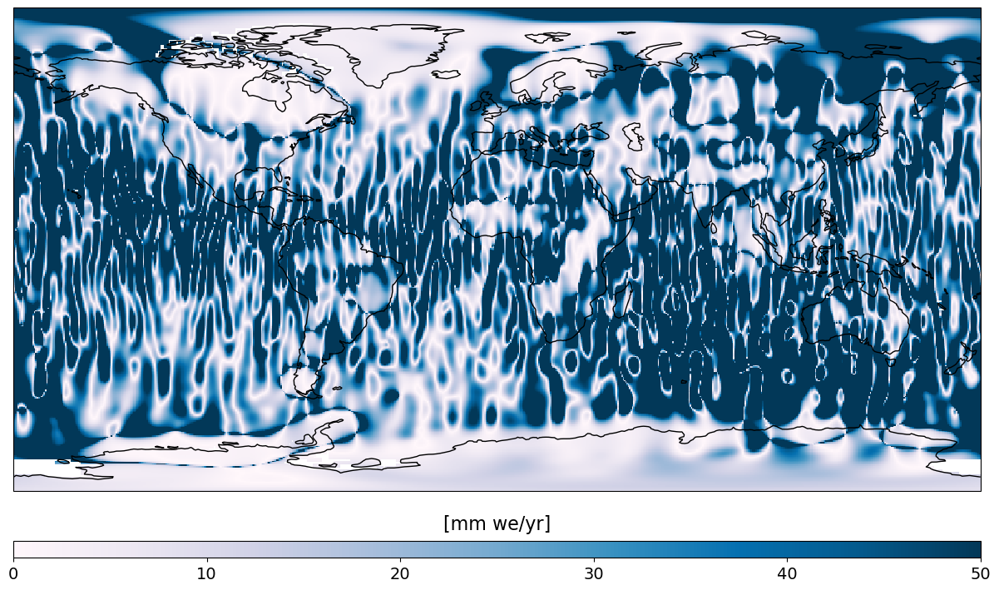

In [108]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import TwoSlopeNorm

# Select dataset variable
tws_hhu = errror_without_kn_Secular_VLM_EWH_percentage_abs_xr

# ----- 1. Define limits -----
vmin = 0
vmax = 50

# Center colormap at zero
norm = TwoSlopeNorm(vmin=vmin, vcenter=25, vmax=vmax)

# ----- 2. Plot -----
fig, ax = plt.subplots(
    figsize=(15, 10),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

im = tws_hhu.plot.imshow(
    ax=ax,
    cmap='PuBu',          # continuous diverging colormap
    norm=norm,
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# ----- 3. Continuous colorbar -----
pos = ax.get_position()
cbar_ax = fig.add_axes([
    pos.x0,
    pos.y0 - 0.08,
    pos.width,
    0.02
])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label('[mm we/yr]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

plt.show()

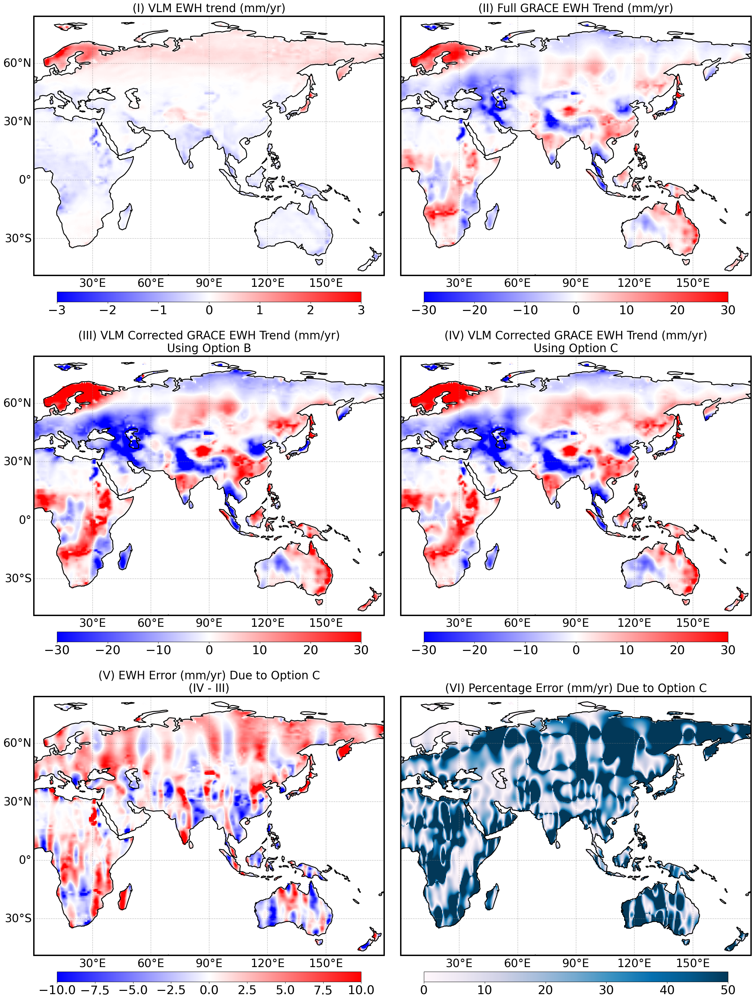

In [81]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.ticker as mticker
import matplotlib.cm as cm


# -----------------------------
# GLOBAL FONT SIZE SETTINGS
# -----------------------------
plt.rcParams.update({
    'xtick.labelsize': 33,
    'ytick.labelsize': 33,
    'axes.titlesize': 40,
    'axes.labelsize': 35
})

proj = ccrs.PlateCarree()

# region bounds
lat_min, lat_max = -49, 84
lon_min, lon_max = 0, 180

# # -----------------------------
# # DEFINE LIGHT GRAY FOR MASKED AREAS
# # -----------------------------
# light_gray = '#d9d9d9'

# cmap_bwr = cm.get_cmap('bwr_r').copy()
# # cmap_bwr.set_bad(light_gray)

# cmap_jet = cm.get_cmap('jet_r').copy()
# # cmap_jet.set_bad(light_gray)



# # 1) subset each dataset to the region
# EWH_trend_vlm_sub = scaled_EWH_trend_vlm.sel(lat=slice(lat_min, lat_max),
#                                       lon=slice(lon_min, lon_max))
# ds_trend_sub = ds_trend.sel(lat=slice(lat_min, lat_max),
#                             lon=slice(lon_min, lon_max))
# ds_trend_correct_sub = ds_trend_correct_VLM_treatment.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# ds_trend_kn_sub = ds_trend_grace_without_kn_secular_VLM_EWH_field.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# err_abs_sub = errror_in_kn_Secular_GRACE_EWH.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )
# err_pct_sub = errror_in_kn_Secular_GRACE_EWH_percentage.sel(
#     lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max)
# )

# 2) figure and axes
fig, axes = plt.subplots(
    nrows=3, ncols=2,
    subplot_kw={'projection': proj},
    figsize=(50, 40)
)

ax11, ax12 = axes[0]
ax21, ax22 = axes[1]
ax31, ax32 = axes[2]

# helper to set common map options
def setup_ax(ax, left_labels=False, bottom_labels=False):
    ax.coastlines(linewidth=2.0)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
    ax.tick_params(labelsize=27)

    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')

    gl = ax.gridlines(
        crs=proj,
        draw_labels=True,
        linewidth=1,
        color='gray',
        alpha=0.5,
        linestyle='--'
    )

    # Label control
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = left_labels
    gl.bottom_labels = bottom_labels

    # Grid spacing
    gl.xlocator = mticker.FixedLocator(range(0, 181, 30))
    gl.ylocator = mticker.FixedLocator(range(-60, 91, 30))

    # Label font size
    gl.xlabel_style = {'size': 25}
    gl.ylabel_style = {'size': 25}


# -----------------------------
# (1,1)
# -----------------------------
p1 = (scaled_EWH_trend_vlm['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax11,
    transform=proj,
    cmap='bwr',
    vmin=-3, vmax=3,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p1.colorbar.ax.tick_params(labelsize=27)
p1.colorbar.set_label('', fontsize=25)

setup_ax(ax11, left_labels=True, bottom_labels=True)
ax11.set_title('(I) VLM EWH trend (mm/yr)', fontsize=25, pad=10)

# -----------------------------
# (1,2)
# -----------------------------
p2 =  (ds_trend['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax12,
    transform=proj,
    cmap='bwr',
    vmin=-30, vmax=30,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p2.colorbar.ax.tick_params(labelsize=27)
p2.colorbar.set_label('', fontsize=25)

setup_ax(ax12, bottom_labels=True)
ax12.set_title('(II) Full GRACE EWH Trend (mm/yr)', fontsize=25, pad=10)

# -----------------------------
# (2,1)
# -----------------------------
p3 = (ds_trend_correct_VLM_treatment['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax21,
    transform=proj,
    cmap='bwr',
    vmin=-30, vmax=30,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p3.colorbar.ax.tick_params(labelsize=27)
p3.colorbar.set_label('', fontsize=25)

setup_ax(ax21, left_labels=True, bottom_labels=True)
ax21.set_title('(III) VLM Corrected GRACE EWH Trend (mm/yr)\nUsing Option B', fontsize=25, pad=10)

# -----------------------------
# (2,2)
# -----------------------------
p4 = (ds_trend_grace_without_kn_secular_VLM_EWH_field['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax22,
    transform=proj,
    cmap='bwr',
    vmin=-30, vmax=30,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p4.colorbar.ax.tick_params(labelsize=27)
p4.colorbar.set_label('', fontsize=25)

setup_ax(ax22, bottom_labels=True)
ax22.set_title('(IV) VLM Corrected GRACE EWH Trend (mm/yr)\nUsing Option C', fontsize=25, pad=10)

# -----------------------------
# (3,1)
# -----------------------------
p5 =  (error_without_kn_in_Secular_VLM_EWH['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax31,
    transform=proj,
    cmap='bwr',
    vmin=-10, vmax=10,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p5.colorbar.ax.tick_params(labelsize=27)
p5.colorbar.set_label('', fontsize=25)

setup_ax(ax31, left_labels=True, bottom_labels=True)
ax31.set_title('(V) EWH Error (mm/yr) Due to Option C\n(IV - III)', fontsize=25, pad=10)

# -----------------------------
# (3,2)
# -----------------------------
p6 =  (errror_without_kn_Secular_VLM_EWH_percent['trend'].where(corrected_ds_jpl == 1)).plot(
    ax=ax32,
    transform=proj,
    cmap='PuBu',
    vmin=0, vmax=50,
    cbar_kwargs={
        'orientation': 'horizontal',
        'pad': 0.05,
        'shrink': 0.34,
        'extend': 'neither',
        'aspect': 30
    }
)
p6.colorbar.ax.tick_params(labelsize=27)
p6.colorbar.set_label('', fontsize=25)

setup_ax(ax32, bottom_labels=True)
ax32.set_title('(VI) Percentage Error (mm/yr) Due to Option C', fontsize=25, pad=10)

# spacing
fig.subplots_adjust(wspace=-0.59, hspace=0.05)

# Save the figure as PNG with 500 dpi
fig.savefig("GRACE_EWH_trends_error_with_option_C_new_ok1.png", dpi=500, bbox_inches='tight')

plt.show()

## Filtering Application

jpl_tws_pysh_normal_300km_GF
jpl_tws_pysh_normal_with_0km_GF

In [65]:
# Check if the file was properly saved at the given location (navigate to the folder) and open it from there again
no_filtering_jpl_sh = xr.open_dataset(r'jpl_tws_pysh_normal_with_0km_GF.nc')
no_filtering_jpl_sh

<xarray.Dataset> Size: 203MB
Dimensions:  (time: 196, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2022-06-30
  * lat      (lat) float64 3kB 89.0 88.5 88.0 87.5 ... -89.0 -89.5 -90.0 -90.5
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
Data variables:
    tws      (time, lat, lon) float32 203MB ...
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [66]:
import xarray as xr
import numpy as np

# Assume `ds` is your xarray dataset
ds_noisy_jpl = no_filtering_jpl_sh    # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = ds_noisy_jpl['lon'] - 0.0  # Wrap around [0, 360)
shifted_lat = ds_noisy_jpl['lat'] + 0.5

# Update the dataset with the corrected coordinates
corrected_ds_noisy_jpl = ds_noisy_jpl.copy()
corrected_ds_noisy_jpl = corrected_ds_noisy_jpl.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_noisy_jpl = corrected_ds_noisy_jpl.sortby('lon')

# Display the corrected dataset
corrected_ds_noisy_jpl

<xarray.Dataset> Size: 203MB
Dimensions:  (time: 196, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2022-06-30
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Data variables:
    tws      (time, lat, lon) float32 203MB ...
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [67]:
# Select the time range from April 2002 to April 2022
subset_noisy_jpl_halfdegree_sh = corrected_ds_noisy_jpl.sel(time=slice("2002-04", "2016-03"))
subset_noisy_jpl_halfdegree_sh

<xarray.Dataset> Size: 145MB
Dimensions:  (time: 140, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Data variables:
    tws      (time, lat, lon) float32 145MB ...
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [68]:
SH_noisy_jpl_tws = subset_noisy_jpl_halfdegree_sh.tws
SH_noisy_jpl_tws = SH_noisy_jpl_tws.resample(time='M').mean().interpolate_na(dim='time')
SH_noisy_jpl_tws

C:\Users\sudur\miniconda3\envs\Thesis\Lib\site-packages\xarray\core\groupby.py:532: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index_grouper = pd.Grouper(


<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 174MB
array([[[ 416.7568  ,  416.7438  ,  416.7267  , ...,  416.7717  ,
          416.77075 ,  416.76578 ],
        [ 370.31268 ,  370.94778 ,  371.54068 , ...,  368.1576  ,
          368.9172  ,  369.63568 ],
        [ 321.23392 ,  323.19412 ,  325.00488 , ...,  314.46518 ,
          316.86844 ,  319.12503 ],
        ...,
        [-153.9043  , -155.26897 , -156.58252 , ..., -149.53311 ,
         -151.03336 , -152.49144 ],
        [-178.22432 , -175.43483 , -172.63246 , ..., -186.52263 ,
         -183.76752 , -181.00165 ],
        [-125.63336 , -123.70127 , -121.76452 , ..., -131.40091 ,
         -129.48326 , -127.560715]],

       [[-173.25511 , -175.10509 , -176.95847 , ..., -167.72697 ,
         -169.56592 , -171.40868 ],
        [ -23.131956,  -27.800926,  -32.483578, ...,   -9.211168,
          -13.836681,  -18.477076],
        [ 122.65769 ,  117.109985,  111.519554, ...,  139.03467 ,
          133.62097 ,  128.16167 ],
...
        [  60.079903,   60.9681  ,   61.835045, ...,   57.287457,
           58.239597,   59.17041 ],
        [  42.984203,   43.767372,   44.542473, ...,   40.586823,
           41.39387 ,   42.193016],
        [  18.29876 ,   18.562466,   18.824814, ...,   17.499788,
           17.767395,   18.03373 ]],

       [[-190.46436 , -190.7437  , -191.02281 , ..., -189.62509 ,
         -189.90504 , -190.1848  ],
        [-156.2954  , -156.78018 , -157.25664 , ..., -154.79071 ,
         -155.30069 , -155.80223 ],
        [-126.80369 , -127.007965, -127.19084 , ..., -126.06103 ,
         -126.33037 , -126.57787 ],
        ...,
        [ -50.59144 ,  -49.460175,  -48.325993, ...,  -53.97092 ,
          -52.846493,  -51.7201  ],
        [  15.80647 ,   16.87248 ,   17.944227, ...,   12.643514,
           13.691918,   14.74626 ],
        [  82.25563 ,   82.59646 ,   82.939095, ...,   81.24439 ,
           81.57956 ,   81.91666 ]]], shape=(168, 360, 720), dtype=float32)
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

In [124]:
SH_noisy_jpl_tws.to_netcdf(r'TWS_pysh_noisy_jpl_no_filtering_sorted.nc')

--------

In [69]:
JPL300_filtering = xr.open_dataset(r'jpl_tws_pysh_normal_with_300km_GF_new.nc')
JPL300_filtering

<xarray.Dataset> Size: 203MB
Dimensions:  (time: 196, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2022-06-30
  * lat      (lat) float64 3kB 89.0 88.5 88.0 87.5 ... -89.0 -89.5 -90.0 -90.5
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
Data variables:
    tws      (time, lat, lon) float32 203MB ...
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [70]:
JPL300_filtering.tws.values

array([[[-23.198605 , -23.19333  , -23.18805  , ..., -23.214375 ,
         -23.209126 , -23.203869 ],
        [-23.14486  , -23.13169  , -23.118542 , ..., -23.184502 ,
         -23.171265 , -23.15805  ],
        [-22.804688 , -22.787865 , -22.771215 , ..., -22.856243 ,
         -22.838873 , -22.821688 ],
        ...,
        [-35.179684 , -35.27842  , -35.377457 , ..., -34.885365 ,
         -34.983147 , -35.081253 ],
        [-34.15086  , -34.205723 , -34.260807 , ..., -33.98768  ,
         -34.041836 , -34.09623  ],
        [-34.184746 , -34.201584 , -34.21847  , ..., -34.134563 ,
         -34.151237 , -34.167965 ]],

       [[-25.684425 , -25.684101 , -25.683773 , ..., -25.685383 ,
         -25.685066 , -25.684746 ],
        [-25.529154 , -25.532482 , -25.535797 , ..., -25.519129 ,
         -25.522474 , -25.525818 ],
        [-25.289164 , -25.30148  , -25.313795 , ..., -25.252314 ,
         -25.264572 , -25.276857 ],
        ...,
        [-34.67779  , -34.737682 , -34.797245 , ..., -

In [71]:
import xarray as xr
import numpy as np

# Assume `ds` is your xarray dataset
ds_jpl300 = JPL300_filtering   # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = ds_jpl300['lon'] - 0.0  # Wrap around [0, 360)
shifted_lat = ds_jpl300['lat'] + 0.5

# Update the dataset with the corrected coordinates
corrected_jpl300_filtering = ds_jpl300.copy()
corrected_jpl300_filtering = corrected_jpl300_filtering.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_jpl300_filtering = corrected_jpl300_filtering.sortby('lon')

# Display the corrected dataset
corrected_jpl300_filtering

<xarray.Dataset> Size: 203MB
Dimensions:  (time: 196, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2022-06-30
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Data variables:
    tws      (time, lat, lon) float32 203MB -23.2 -23.19 -23.19 ... 115.9 115.9
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [72]:
# Select the time range from April 2002 to April 2022
subset_jpl300kmfiltering_halfdegree_sh = corrected_jpl300_filtering.sel(time=slice("2002-04", "2016-03"))
subset_jpl300kmfiltering_halfdegree_sh

<xarray.Dataset> Size: 145MB
Dimensions:  (time: 140, lat: 360, lon: 720)
Coordinates:
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
Data variables:
    tws      (time, lat, lon) float32 145MB -23.2 -23.19 -23.19 ... 47.46 47.47
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2004...
    units:        mm

In [73]:
jpl300kmfiltering_tws = subset_jpl300kmfiltering_halfdegree_sh.tws
jpl300kmfiltering_tws = jpl300kmfiltering_tws.resample(time='M').mean().interpolate_na(dim='time')
jpl300kmfiltering_tws

C:\Users\sudur\miniconda3\envs\Thesis\Lib\site-packages\xarray\core\groupby.py:532: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index_grouper = pd.Grouper(


<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 174MB
array([[[-23.198605 , -23.19333  , -23.18805  , ..., -23.214375 ,
         -23.209126 , -23.203869 ],
        [-23.14486  , -23.13169  , -23.118542 , ..., -23.184502 ,
         -23.171265 , -23.15805  ],
        [-22.804688 , -22.787865 , -22.771215 , ..., -22.856243 ,
         -22.838873 , -22.821688 ],
        ...,
        [-35.179684 , -35.27842  , -35.377457 , ..., -34.885365 ,
         -34.983147 , -35.081253 ],
        [-34.15086  , -34.205723 , -34.260807 , ..., -33.98768  ,
         -34.041836 , -34.09623  ],
        [-34.184746 , -34.201584 , -34.21847  , ..., -34.134563 ,
         -34.151237 , -34.167965 ]],

       [[-25.684425 , -25.684101 , -25.683773 , ..., -25.685383 ,
         -25.685066 , -25.684746 ],
        [-25.529154 , -25.532482 , -25.535797 , ..., -25.519129 ,
         -25.522474 , -25.525818 ],
        [-25.289164 , -25.30148  , -25.313795 , ..., -25.252314 ,
         -25.264572 , -25.276857 ],
...
        [ 42.38425  ,  42.46603  ,  42.54707  , ...,  42.134674 ,
          42.218555 ,  42.301754 ],
        [ 38.23035  ,  38.26842  ,  38.30622  , ...,  38.114574 ,
          38.153423 ,  38.19202  ],
        [ 35.935852 ,  35.945442 ,  35.95499  , ...,  35.9068   ,
          35.916527 ,  35.926212 ]],

       [[-22.009466 , -22.018505 , -22.027567 , ..., -21.982494 ,
         -21.99146  , -22.00045  ],
        [-21.33875  , -21.363132 , -21.387554 , ..., -21.265863 ,
         -21.290115 , -21.314411 ],
        [-20.680403 , -20.717999 , -20.755604 , ..., -20.567684 ,
         -20.605244 , -20.642817 ],
        ...,
        [ 53.319645 ,  53.40106  ,  53.481846 , ...,  53.071823 ,
          53.155014 ,  53.237625 ],
        [ 49.53187  ,  49.57053  ,  49.60896  , ...,  49.414577 ,
          49.453888 ,  49.492992 ],
        [ 47.484142 ,  47.494057 ,  47.503933 , ...,  47.45416  ,
          47.46419  ,  47.474186 ]]], shape=(168, 360, 720), dtype=float32)
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

In [162]:
jpl300kmfiltering_tws.to_netcdf(r'jpl300kmfiltering_sorted2.nc')

-------

In [74]:
JPLnoGF_TWS = xr.open_dataset(r'TWS_pysh_noisy_jpl_no_filtering_sorted.nc')
JPLnoGF_TWS

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

In [75]:
JPLnoGF_tws = JPLnoGF_TWS.tws
JPLnoGF_tws

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 174MB
[43545600 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

-------

In [76]:
JPL300kmGF_TWS = xr.open_dataset(r'jpl300kmfiltering_sorted2.nc')
JPL300kmGF_TWS

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

In [77]:
JPL300kmGF_tws = JPL300kmGF_TWS.tws
JPL300kmGF_tws

<xarray.DataArray 'tws' (time: 168, lat: 360, lon: 720)> Size: 174MB
[43545600 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 6kB -180.0 -179.5 -179.0 -178.5 ... 178.5 179.0 179.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

--------

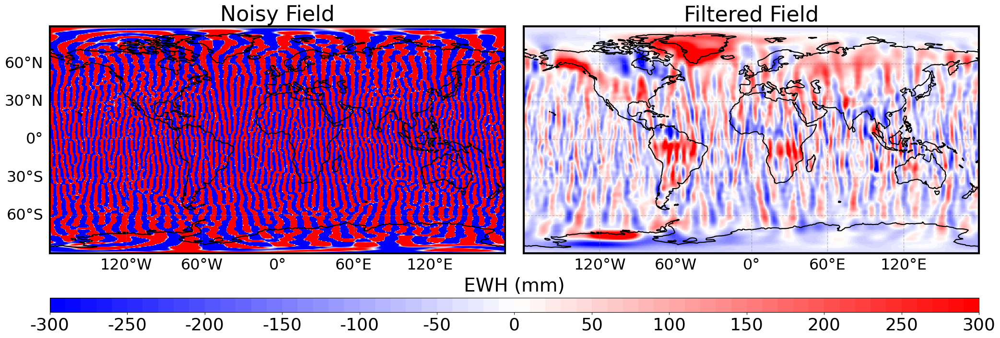

In [113]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as colors

# Correct and monotonic irregular levels
levels = [
     -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]

# Optional: keep BoundaryNorm for consistent coloring
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (JPLnoGF_TWS, 'Noisy Field'),
    (JPL300kmGF_TWS, 'Filtered Field')
]

# -----------------------------
# Helper function to add gridlines
# -----------------------------
def add_gridlines(ax, x_interval=60, y_interval=30,
                  left_labels=True, bottom_labels=True,
                  right_labels=False, top_labels=False,
                  fontsize=23):
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=1,
        color='gray',
        alpha=0.5,
        linestyle='--'
    )
    gl.left_labels = left_labels
    gl.bottom_labels = bottom_labels
    gl.right_labels = right_labels
    gl.top_labels = top_labels
    gl.xlocator = mticker.FixedLocator(range(-120, 121, 60))
    gl.ylocator = mticker.FixedLocator(range(-90, 91, 30))

    
    gl.xpadding = 10   # horizontal label distance
    gl.ypadding = 10   # vertical label distance

    
    gl.xlabel_style = {'size': fontsize}
    gl.ylabel_style = {'size': fontsize}

# Create subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(25, 20),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

for ax, (ds, title) in zip(axes, datasets):
    
    da = ds['tws'].sel(time="2002-04-16", method='nearest')
    
    # Use imshow style plotting
    im = da.plot.imshow(
        ax=ax,
        levels=levels,
        cmap="bwr",
        norm=norm,
        transform=ccrs.PlateCarree(),
        add_colorbar=False
    )

    # Add coastlines & borders
    ax.coastlines()
    ax.coastlines(linewidth=1.5)
    # ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Add gridlines
    add_gridlines(ax,
                  x_interval=60,
                  y_interval=30,
                  left_labels=(ax==axes[0]),
                  bottom_labels=True,
                  fontsize=23)

    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')
    
    # Clean title (instead of ax.text)
    ax.set_title(title, fontsize=32, pad=8)

# ---- Shared centered colorbar ----

pos_left = axes[0].get_position()
pos_right = axes[1].get_position()

cbar_left = pos_left.x0
cbar_right = pos_right.x1
cbar_width = cbar_right - cbar_left
cbar_bottom = pos_left.y0 - 0.07
cbar_height = 0.015

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])

cbar = fig.colorbar(
    im,
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_ticks([v for v in levels if v % 50 == 0])
cbar.ax.set_xlabel("EWH (mm)", fontsize=28, labelpad=10)
cbar.ax.tick_params(labelsize=26)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))

cbar.minorticks_off()

plt.subplots_adjust(wspace=0.04)


plt.savefig(r'Illustration_of_GF_without_SE_correction_JPL_SH_for_LR2_new.png', dpi=300, bbox_inches='tight')
plt.show()

---------
--------

In [88]:
Half_degree_SF = xr.open_dataset(r'Scale_factor_half_degree_renamed_full_range.nc')
Half_degree_SF

<xarray.Dataset> Size: 2MB
Dimensions:       (lon: 720, lat: 360)
Coordinates:
  * lon           (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat           (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
Data variables:
    SCALE_FACTOR  (lat, lon) float64 2MB ...

In [89]:
apparent_TWS_fields_jpl = xr.open_dataset(r'Total_TWS_fields_solid_earth_corrected_JPL_solutions.nc')
apparent_TWS_fields_jpl

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [90]:
True_scaled_TWS_field_jpl = xr.open_dataset(r'Scaled_total_TWS_JPL_field.nc')
True_scaled_TWS_field_jpl

<xarray.Dataset> Size: 348MB
Dimensions:                        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon                            (lon) float64 6kB 0.0 0.5 1.0 ... 359.0 359.5
  * lat                            (lat) float64 3kB 89.5 89.0 ... -89.5 -90.0
  * time                           (time) datetime64[ns] 1kB 2002-04-30 ... 2...
Data variables:
    __xarray_dataarray_variable__  (time, lat, lon) float64 348MB ...

In [91]:
True_scaled_TWS_field_jpl = True_scaled_TWS_field_jpl.rename({'__xarray_dataarray_variable__': 'tws'})
True_scaled_TWS_field_jpl 

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [92]:
t = True_scaled_TWS_field_jpl['tws'].isel(time=0)
t

<xarray.DataArray 'tws' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [93]:
import numpy as np

np.isnan(t).sum().item()

0

In [94]:
a = apparent_TWS_fields_jpl['tws'].isel(time=0)
a

<xarray.DataArray 'tws' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Difference of rigid earth TWS trend and vlm TWS trend propa...

In [95]:
import numpy as np

np.isnan(a).sum().item()

0

-------
------

In [96]:
leakage_mass = (
    True_scaled_TWS_field_jpl['tws'].isel(time=0)
    - apparent_TWS_fields_jpl['tws'].isel(time=0)
)
leakage_mass

<xarray.DataArray 'tws' (lat: 360, lon: 720)> Size: 2MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [97]:
leakage_mass.isnull().sum().item()

0

-------

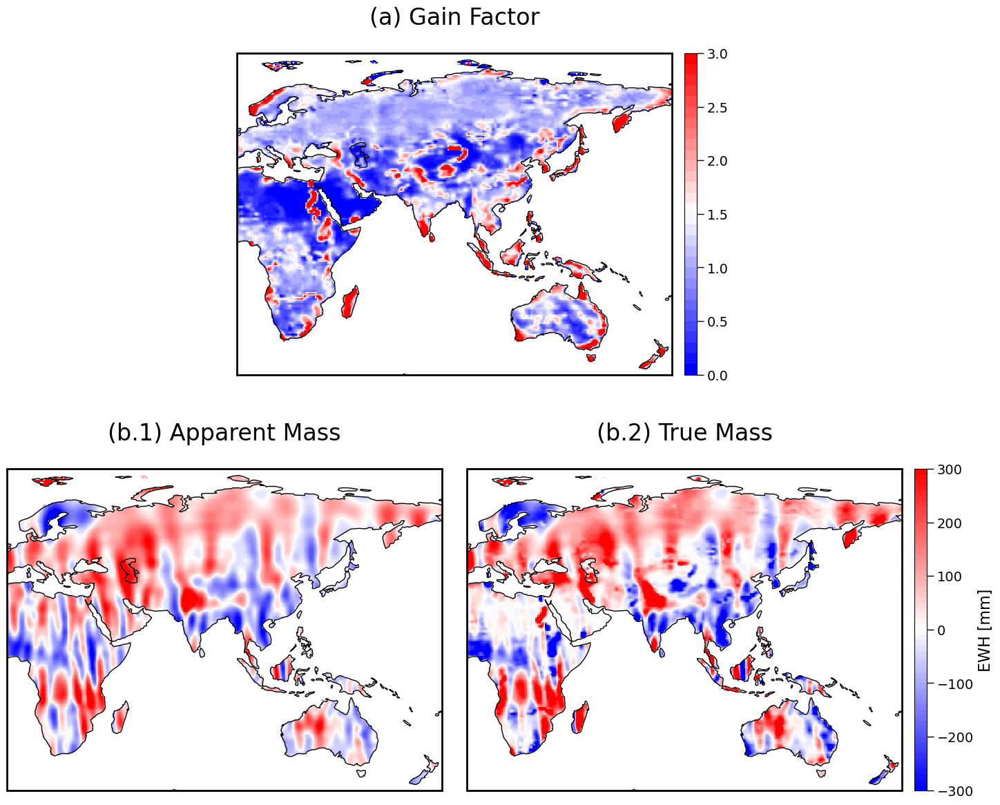

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors

# -----------------------------
# Region bounds
# -----------------------------
lat_min, lat_max = -49, 84
lon_min, lon_max = 0, 180

# -----------------------------
# Scale factor levels
# -----------------------------
levels_sf = np.arange(0, 3.1, 0.1)
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)
major_ticks_sf = np.arange(0, 3.1, 0.5)

# -----------------------------
# Mass levels
# -----------------------------
levels_mass = np.arange(-300, 301, 10)
major_ticks_mass = np.arange(-300, 310, 100)
norm_mass = colors.BoundaryNorm(levels_mass, ncolors=256, clip=True)

# -----------------------------
# Datasets (replace with your actual data)
# -----------------------------
datasets = [
    (Half_degree_SF['SCALE_FACTOR']
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(a) Gain Factor'),

    (apparent_TWS_fields_jpl['tws']
     .isel(time=0)
     .where(corrected_ds_jpl == 1),
     '(b.1) Apparent Mass'),

    (True_scaled_TWS_field_jpl['tws']
     .isel(time=0)
     .where(corrected_ds_jpl == 1),
     '(b.2) True Mass')
]

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(18, 14))

# -----------------------------
# Define common size for all subplots
# -----------------------------
ax_width = 0.35
ax_height = 0.38
h_gap = 0.02  # horizontal gap between bottom subplots
v_gap = 0.05  # vertical gap between top and bottom row

# Bottom row positions
left_x = 0.1
mid_x = left_x + ax_width + h_gap
bottom_y = 0.08

# Top subplot position (centered horizontally)
top_x = left_x + (mid_x - left_x)/2  # center over bottom row
top_y = bottom_y + ax_height + v_gap
top_width = ax_width
top_height = ax_height

# -----------------------------
# Top subplot (Gain Factor)
# -----------------------------
ax_sf = fig.add_axes([top_x, top_y, top_width, top_height], projection=ccrs.PlateCarree())
da_sf, title_sf = datasets[0]

im_sf = da_sf.plot.imshow(
    ax=ax_sf, cmap='bwr', norm=norm_sf,
    transform=ccrs.PlateCarree(), add_colorbar=False, rasterized=True
)
ax_sf.coastlines()
ax_sf.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_sf.set_aspect('equal', adjustable='box')
ax_sf.set_title(title_sf, fontsize=24, y=1.03, pad=20)
for spine in ax_sf.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Colorbar for top subplot aligned with axes height
fig.canvas.draw()  # Ensure renderer updates positions
pos_sf = ax_sf.get_position()
cax_sf = fig.add_axes([pos_sf.x1 + 0.01, pos_sf.y0, 0.01, pos_sf.height])
im_sf.set_clim(levels_sf[0], levels_sf[-1])
cbar_sf = fig.colorbar(im_sf, cax=cax_sf, orientation='vertical')
cbar_sf.set_ticks(major_ticks_sf)
cbar_sf.ax.minorticks_off()
cbar_sf.ax.tick_params(labelsize=14, length=7, width=1, direction='out')

# -----------------------------
# Bottom row subplots (Mass)
# -----------------------------
axes_mass = []
for i, x_pos in enumerate([left_x, mid_x]):
    ax = fig.add_axes([x_pos, bottom_y, ax_width, ax_height], projection=ccrs.PlateCarree())
    da, title = datasets[i+1]
    da_cropped = da.sel(lat=slice(lat_max, lat_min), lon=slice(lon_min, lon_max))
    im = da_cropped.plot.imshow(
        ax=ax, cmap='bwr', norm=norm_mass,
        transform=ccrs.PlateCarree(), add_colorbar=False, rasterized=True
    )
    axes_mass.append(ax)

    ax.coastlines()
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.set_aspect('equal', adjustable='box')
    ax.set_title(title, fontsize=24, y=1.03, pad=20)
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Shared colorbar for bottom row aligned with axes heights
fig.canvas.draw()
pos_left = axes_mass[0].get_position()
pos_right = axes_mass[1].get_position()
y_bottom_cb = min(pos_left.y0, pos_right.y0)
y_top_cb = max(pos_left.y0 + pos_left.height, pos_right.y0 + pos_right.height)
height_cb = y_top_cb - y_bottom_cb
right_x_cb = mid_x + ax_width + 0.01

cax_mass = fig.add_axes([right_x_cb, y_bottom_cb, 0.01, height_cb])
im_mass_plot = axes_mass[0].images[0]  # reference image for colorbar
im_mass_plot.set_clim(levels_mass[0], levels_mass[-1])

cbar_mass = fig.colorbar(im_mass_plot, cax=cax_mass, orientation='vertical')
cbar_mass.set_ticks(major_ticks_mass)
cbar_mass.ax.minorticks_off()
cbar_mass.ax.tick_params(labelsize=14, length=7, width=1, direction='out')
cbar_mass.set_label("EWH (mm)", fontsize=16)

plt.show()

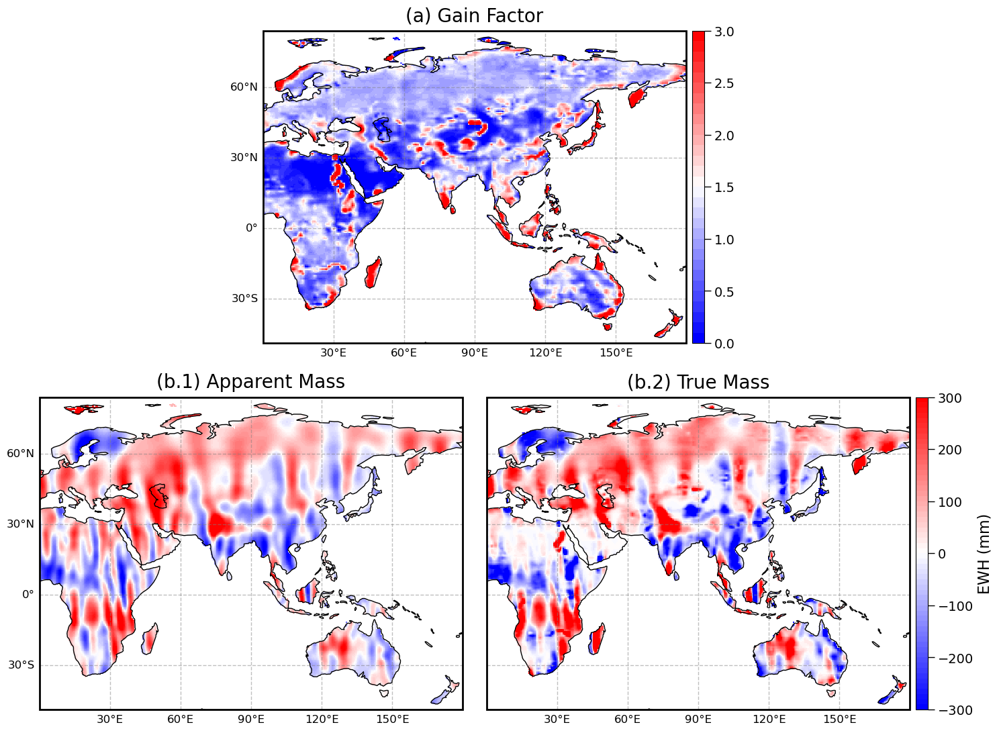

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors
import matplotlib.ticker as mticker

# -----------------------------
# Region bounds
# -----------------------------
lat_min, lat_max = -49, 84
lon_min, lon_max = 0, 180

# -----------------------------
# Scale factor levels
# -----------------------------
levels_sf = np.arange(0, 3.1, 0.1)
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)
major_ticks_sf = np.arange(0, 3.1, 0.5)

# -----------------------------
# Mass levels
# -----------------------------
levels_mass = np.arange(-300, 301, 10)
major_ticks_mass = np.arange(-300, 310, 100)
norm_mass = colors.BoundaryNorm(levels_mass, ncolors=256, clip=True)

# -----------------------------
# Datasets (replace with your actual data)
# -----------------------------
datasets = [
    (Half_degree_SF['SCALE_FACTOR']
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(a) Gain Factor'),

    (apparent_TWS_fields_jpl['tws']
     .isel(time=0)
     .where(corrected_ds_jpl == 1),
     '(b.1) Apparent Mass'),

    (True_scaled_TWS_field_jpl['tws']
     .isel(time=0)
     .where(corrected_ds_jpl == 1),
     '(b.2) True Mass'),

    (leakage_mass
        .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(c.1) Leakage  Mass')

]

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(18, 14))

# -----------------------------
# Define common size for all subplots
# -----------------------------
ax_width = 0.35
ax_height = 0.38
h_gap = 0.02  # horizontal gap between bottom subplots
v_gap = 0.01  # vertical gap between top and bottom row

# Bottom row positions
left_x = 0.1
mid_x = left_x + ax_width + h_gap
bottom_y = 0.08

# Top subplot position (centered horizontally)
top_x = left_x + (mid_x - left_x)/2  # center over bottom row
top_y = bottom_y + ax_height + v_gap
top_width = ax_width
top_height = ax_height

# -----------------------------
# Helper function to add gridlines
# -----------------------------
def add_gridlines(ax, left_labels=True, bottom_labels=True, right_labels=False, top_labels=False):
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=1,
        color='gray',
        alpha=0.5,
        linestyle='--'
    )
    gl.left_labels = left_labels
    gl.bottom_labels = bottom_labels
    gl.right_labels = right_labels
    gl.top_labels = top_labels
    gl.xlocator = mticker.FixedLocator(np.arange(0, 181, 30))
    gl.ylocator = mticker.FixedLocator(np.arange(-60, 91, 30))
    gl.xlabel_style = {'size': 12}
    gl.ylabel_style = {'size': 12}

# -----------------------------
# Top subplot (Gain Factor)
# -----------------------------
ax_sf = fig.add_axes([top_x, top_y, top_width, top_height], projection=ccrs.PlateCarree())
da_sf, title_sf = datasets[0]

im_sf = da_sf.plot.imshow(
    ax=ax_sf, cmap='bwr', norm=norm_sf,
    transform=ccrs.PlateCarree(), add_colorbar=False, rasterized=True
)
ax_sf.coastlines()
ax_sf.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_sf.set_aspect('equal', adjustable='box')
ax_sf.set_title(title_sf, fontsize=20, y=1.03, pad=0.2)
add_gridlines(ax_sf, left_labels=True, bottom_labels=True)
for spine in ax_sf.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')


# Colorbar for top subplot (thin)
fig.canvas.draw()
pos_sf = ax_sf.get_position()
cax_sf = fig.add_axes([pos_sf.x1 + 0.005, pos_sf.y0, 0.01, pos_sf.height])
im_sf.set_clim(levels_sf[0], levels_sf[-1])
cbar_sf = fig.colorbar(im_sf, cax=cax_sf, orientation='vertical')
cbar_sf.set_ticks(major_ticks_sf)
cbar_sf.ax.minorticks_off()
cbar_sf.ax.tick_params(labelsize=14, length=7, width=1, direction='out')

# -----------------------------
# Bottom row subplots (Mass)
# -----------------------------
axes_mass = []
for i, x_pos in enumerate([left_x, mid_x]):
    ax = fig.add_axes([x_pos, bottom_y, ax_width, ax_height],
                      projection=ccrs.PlateCarree())

    da, title = datasets[i+1]
    da_cropped = da.sel(lat=slice(lat_max, lat_min),
                        lon=slice(lon_min, lon_max))

    im = da_cropped.plot.imshow(
        ax=ax, cmap='bwr', norm=norm_mass,
        transform=ccrs.PlateCarree(),
        add_colorbar=False, rasterized=True
    )

    axes_mass.append(ax)

    ax.coastlines()
    ax.set_extent([lon_min, lon_max, lat_min, lat_max],
                  crs=ccrs.PlateCarree())
    ax.set_aspect('equal', adjustable='box')
    ax.set_title(title, fontsize=20, y=1.03, pad=0.2)

    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

    # ✅ Only left subplot gets labels
    if i == 0:
        add_gridlines(ax, left_labels=True, bottom_labels=True)
    else:
        add_gridlines(ax, left_labels=False, bottom_labels=True)


# Shared colorbar for bottom row (thin)
fig.canvas.draw()
pos_left = axes_mass[0].get_position()
pos_right = axes_mass[1].get_position()
y_bottom_cb = min(pos_left.y0, pos_right.y0)
y_top_cb = max(pos_left.y0 + pos_left.height, pos_right.y0 + pos_right.height)
height_cb = y_top_cb - y_bottom_cb
right_x_cb = mid_x + ax_width + 0.005  # thin

cax_mass = fig.add_axes([right_x_cb, y_bottom_cb, 0.01, height_cb])
im_mass_plot = axes_mass[0].images[0]  # reference image for colorbar
im_mass_plot.set_clim(levels_mass[0], levels_mass[-1])

cbar_mass = fig.colorbar(im_mass_plot, cax=cax_mass, orientation='vertical')
cbar_mass.set_ticks(major_ticks_mass)
cbar_mass.ax.minorticks_off()
cbar_mass.ax.tick_params(labelsize=14, length=7, width=1, direction='out')
cbar_mass.set_label("EWH (mm)", fontsize=16)

plt.show()

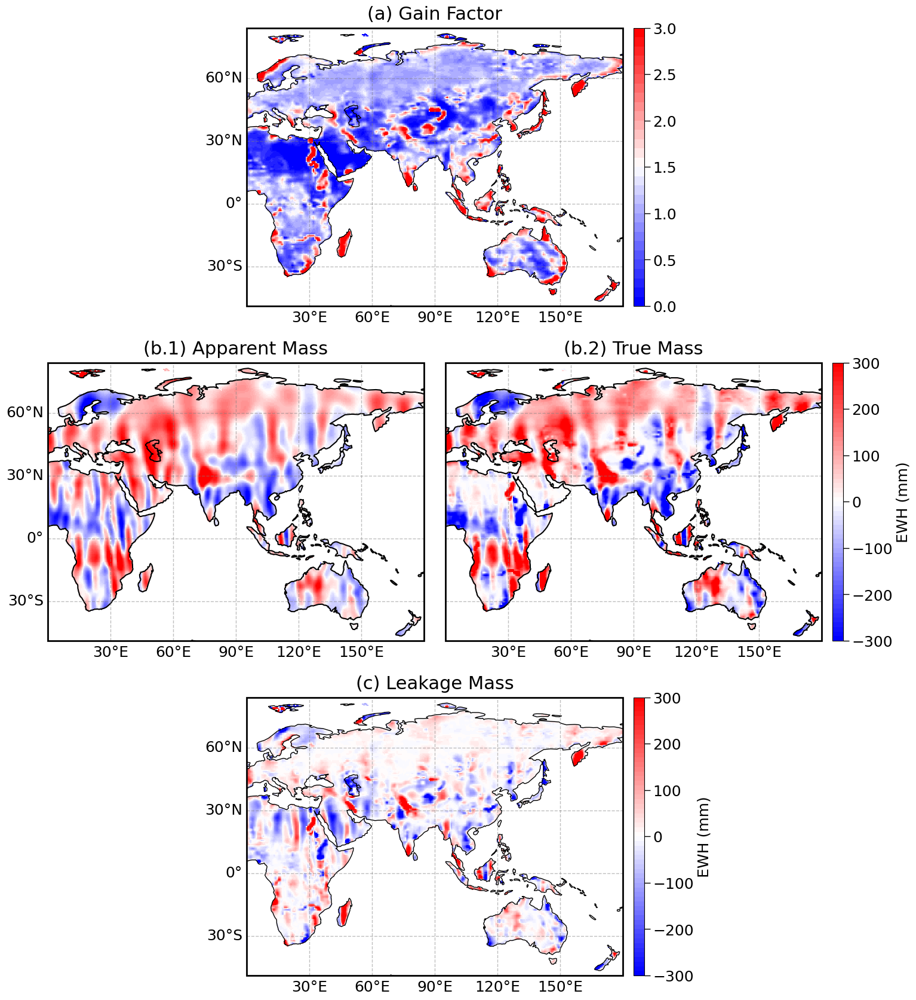

In [106]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors
import matplotlib.ticker as mticker

# -----------------------------
# Region bounds
# -----------------------------
lat_min, lat_max = -49, 84
lon_min, lon_max = 0, 180

# -----------------------------
# Scale factor levels
# -----------------------------
levels_sf = np.arange(0, 3.1, 0.1)
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)
major_ticks_sf = np.arange(0, 3.1, 0.5)

# -----------------------------
# Mass levels
# -----------------------------
levels_mass = np.arange(-300, 301, 10)
major_ticks_mass = np.arange(-300, 310, 100)
norm_mass = colors.BoundaryNorm(levels_mass, ncolors=256, clip=True)

# -----------------------------
# Datasets (STRICT cropping)
# -----------------------------
datasets = [
    (Half_degree_SF['SCALE_FACTOR']
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(a) Gain Factor'),

    (apparent_TWS_fields_jpl['tws']
     .isel(time=0)
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(b.1) Apparent Mass'),

    (True_scaled_TWS_field_jpl['tws']
     .isel(time=0)
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(b.2) True Mass'),

    (leakage_mass
     .sel(lat=slice(lat_max, lat_min),
          lon=slice(lon_min, lon_max))
     .where(corrected_ds_jpl == 1),
     '(c) Leakage Mass')
]

# -----------------------------
# Figure setup
# -----------------------------
fig = plt.figure(figsize=(18, 20))

# -----------------------------
# Layout parameters (same logic)
# -----------------------------
ax_width = 0.35
ax_height = 0.38
h_gap = 0.02
v_gap = -0.1

left_x = 0.1
mid_x = left_x + ax_width + h_gap

bottom_y = 0.28
top_y = bottom_y + ax_height + v_gap
third_y = bottom_y - ax_height - v_gap

top_x = left_x + (mid_x - left_x)/2

# -----------------------------
# Helper function for gridlines
# -----------------------------
def add_gridlines(ax, left_labels=True, bottom_labels=True):
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=1,
        color='gray',
        alpha=0.5,
        linestyle='--'
    )
    gl.left_labels = left_labels
    gl.bottom_labels = bottom_labels
    gl.right_labels = False
    gl.top_labels = False
    gl.xlocator = mticker.FixedLocator(np.arange(0, 181, 30))
    gl.ylocator = mticker.FixedLocator(np.arange(-60, 91, 30))
    gl.xlabel_style = {'size': 18}
    gl.ylabel_style = {'size': 18}

# =============================
# (a) Gain Factor (Top Center)
# =============================
ax_sf = fig.add_axes(
    [top_x, top_y, ax_width, ax_height],
    projection=ccrs.PlateCarree()
)

da_sf, title_sf = datasets[0]

im_sf = da_sf.plot.imshow(
    ax=ax_sf,
    cmap='bwr',
    norm=norm_sf,
    transform=ccrs.PlateCarree(),
    add_colorbar=False,
    rasterized=True
)

ax_sf.coastlines()
ax_sf.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_sf.set_aspect('equal', adjustable='box')
ax_sf.set_title(title_sf, fontsize=22, y=1.03, pad=0.2)
add_gridlines(ax_sf, left_labels=True, bottom_labels=True)

for spine in ax_sf.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Colorbar (Gain Factor)
fig.canvas.draw()
pos_sf = ax_sf.get_position()

cax_sf = fig.add_axes([pos_sf.x1 + 0.01,
                       pos_sf.y0,
                       0.01,
                       pos_sf.height])

im_sf.set_clim(levels_sf[0], levels_sf[-1])

cbar_sf = fig.colorbar(im_sf, cax=cax_sf, orientation='vertical')
cbar_sf.set_ticks(major_ticks_sf)
cbar_sf.ax.minorticks_off()
cbar_sf.ax.tick_params(labelsize=18, length=7, width=1, direction='out')

# =============================
# (b.1) & (b.2) Bottom Row
# =============================
axes_mass = []

for i, x_pos in enumerate([left_x, mid_x]):

    ax = fig.add_axes(
        [x_pos, bottom_y, ax_width, ax_height],
        projection=ccrs.PlateCarree()
    )

    da, title = datasets[i+1]

    im = da.plot.imshow(
        ax=ax,
        cmap='bwr',
        norm=norm_mass,
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )

    axes_mass.append(ax)

    ax.coastlines(linewidth=1.5, color='black')  # black and thicker
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.set_aspect('equal', adjustable='box')
    ax.set_title(title, fontsize=22, y=1.03, pad=0.2)

    add_gridlines(ax, left_labels=(i==0), bottom_labels=True)

    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Shared colorbar (bottom row)
fig.canvas.draw()

pos_left = axes_mass[0].get_position()
pos_right = axes_mass[1].get_position()

y_bottom_cb = min(pos_left.y0, pos_right.y0)
y_top_cb = max(pos_left.y0 + pos_left.height,
               pos_right.y0 + pos_right.height)

height_cb = y_top_cb - y_bottom_cb
right_x_cb = mid_x + ax_width + 0.01

cax_mass = fig.add_axes([right_x_cb,
                         y_bottom_cb,
                         0.01,
                         height_cb])

im_mass_plot = axes_mass[0].images[0]
im_mass_plot.set_clim(levels_mass[0], levels_mass[-1])

cbar_mass = fig.colorbar(im_mass_plot,
                         cax=cax_mass,
                         orientation='vertical')

cbar_mass.set_ticks(major_ticks_mass)
cbar_mass.ax.minorticks_off()
cbar_mass.ax.tick_params(labelsize=18,
                         length=7,
                         width=1,
                         direction='out')
cbar_mass.set_label("EWH (mm)", fontsize=18)

# =============================
# (c.1) Leakage (Centered 3rd Row)
# =============================
ax_leak = fig.add_axes(
    [top_x, third_y, ax_width, ax_height],
    projection=ccrs.PlateCarree()
)

da_leak, title_leak = datasets[3]

im_leak = da_leak.plot.imshow(
    ax=ax_leak,
    cmap='bwr',
    norm=norm_mass,
    transform=ccrs.PlateCarree(),
    add_colorbar=False,
    rasterized=True
)

ax_leak.coastlines()
ax_leak.set_extent([lon_min, lon_max, lat_min, lat_max],
                   crs=ccrs.PlateCarree())
ax_leak.set_aspect('equal', adjustable='box')
ax_leak.set_title(title_leak, fontsize=22, y=1.03, pad=0.2)

add_gridlines(ax_leak, left_labels=True, bottom_labels=True)

for spine in ax_leak.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Colorbar (Leakage)
fig.canvas.draw()
pos_leak = ax_leak.get_position()

cax_leak = fig.add_axes([pos_leak.x1 + 0.01,
                         pos_leak.y0,
                         0.01,
                         pos_leak.height])

im_leak.set_clim(levels_mass[0], levels_mass[-1])

cbar_leak = fig.colorbar(im_leak,
                         cax=cax_leak,
                         orientation='vertical')

cbar_leak.set_ticks(major_ticks_mass)
cbar_leak.ax.minorticks_off()
cbar_leak.ax.tick_params(labelsize=18,
                         length=7,
                         width=1,
                         direction='out')
cbar_leak.set_label("EWH (mm)", fontsize=18)


# After all plotting is done, before or after plt.show()
plt.savefig('GainFactor_Apparent_True_Leakage_JPL_LR2_new.png', dpi=500, bbox_inches='tight')
plt.show()